## DECOLABEL results

I have run first tests for the UNet with the segmentation label, and here I'll take a look to them. 

### The data shown is Sensim data for 0nubb and 1eroi for 5 bar.

### Data

Firstly let's take a look to the data, how it behaves (more or less) using the info of the labelling.

In [1]:
import os
import sys
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
sys.path.append('/home/usc/ie/mpm/NEXT_graphs')

from NEXT_graphNN.utils.read_tensorboard import load_tensorboard_df
from sklearn.metrics import roc_curve, auc

from invisible_cities.io.dst_io import load_dst
sys.path.append(os.getenv('HOME') + '/data_labelling/')

from utils.plotting_utils import plot_3d_hits, plot_3d_vox, plot_cloud_voxels_and_hits, plot_cloud_voxels_and_hits_discrete

sys.path.append(os.getenv('HOME') + '/NEXT_SPARSECONVNET/')

In [2]:
test_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/pressure_topology/5bar/scn_sensim_trains/15mm_vox/dataset_5bar_sensim_15mm_scn_test.h5'

events_info = pd.read_hdf(test_file, 'DATASET/EventsInfo')
events_voxel = pd.read_hdf(test_file, 'DATASET/Voxels')
bins_info = pd.read_hdf(test_file, 'DATASET/BinsInfo')

In [3]:
# % of events of 0nubb
events_info.binclass.sum() / len(events_info)

0.5039015606242497

In [4]:
1 - events_info.binclass.sum() / len(events_info)

0.49609843937575027

In [5]:
data_info = events_voxel.groupby(['dataset_id', 'decolabel']).agg({'energy':[('decoener', 'sum'), ('deconvox', 'count')]})

data_info.columns = data_info.columns.get_level_values(1)

data_info.reset_index(inplace = True)

data_info = data_info.merge(data_info.groupby('dataset_id').deconvox.sum().rename('tot_vox'), on = 'dataset_id')

data_info['ratio_ene_vox'] = data_info.decoener.values / data_info.deconvox.values


data_info['norm_nvox'] = data_info.deconvox.values / data_info.tot_vox.values

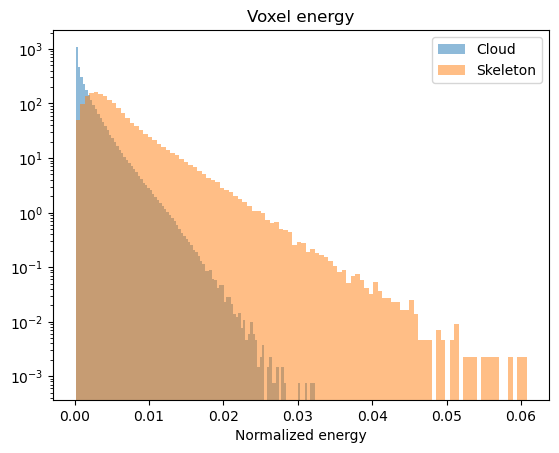

In [6]:
plt.hist(events_voxel[events_voxel.decolabel == 0].energy, 100, density = True, alpha = 0.5, label = 'Cloud')
plt.hist(events_voxel[events_voxel.decolabel == 1].energy, 100, density = True, alpha = 0.5, label = 'Skeleton')
plt.title('Voxel energy')
plt.xlabel('Normalized energy')
plt.yscale('log')
plt.legend()
plt.show()

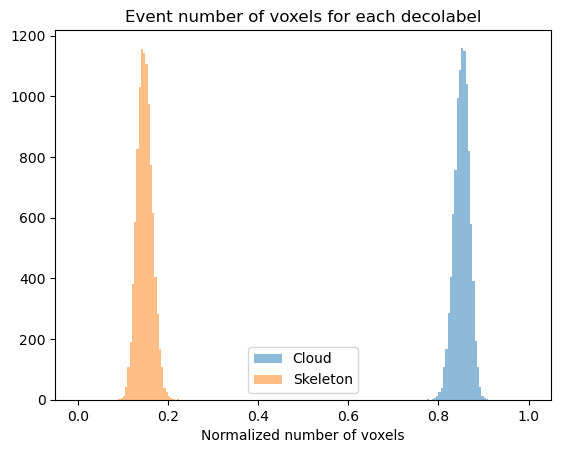

In [7]:
plt.hist(data_info[data_info.decolabel == 0].norm_nvox, 200, (0, 1), alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].norm_nvox, 200, (0, 1), alpha = 0.5, label = 'Skeleton')
plt.title('Event number of voxels for each decolabel')
plt.xlabel('Normalized number of voxels')
plt.legend()
plt.show()

In [8]:
(data_info[data_info.decolabel == 1].deconvox.values / data_info.groupby('dataset_id').deconvox.sum().values).max()

0.2235294117647059

El máximo % de voxeles que son de traza en estos eventos ronda el 22%. Es decir no debería haber eventos que tengan más de ese número en la predicción, pero evidentemente como vamos a priorizar que sea continua la traza a que limpie hits de cloud, para nosotros va a subir este valor.

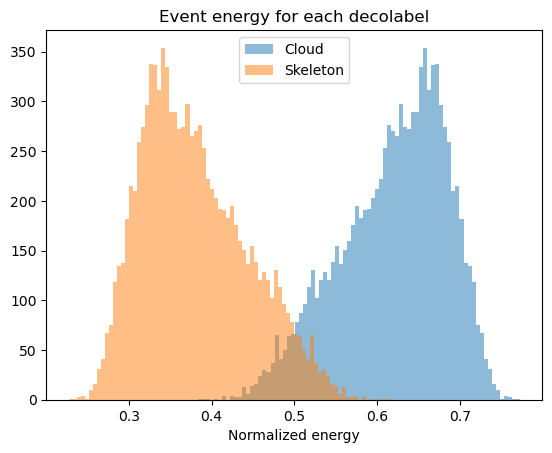

In [9]:
plt.hist(data_info[data_info.decolabel == 0].decoener, 80, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].decoener, 80, alpha = 0.5, label = 'Skeleton')
plt.title('Event energy for each decolabel')
plt.xlabel('Normalized energy')
plt.legend()
plt.show()

In [10]:
data_info[data_info.decolabel == 1].decoener.max()

0.6162287034363269

Agrupando todos los voxeles de traza, van a tener como maximísimo el 61% de la energía total, pero vemos en la distribución que en general tienen menos del 50% de la energía total.

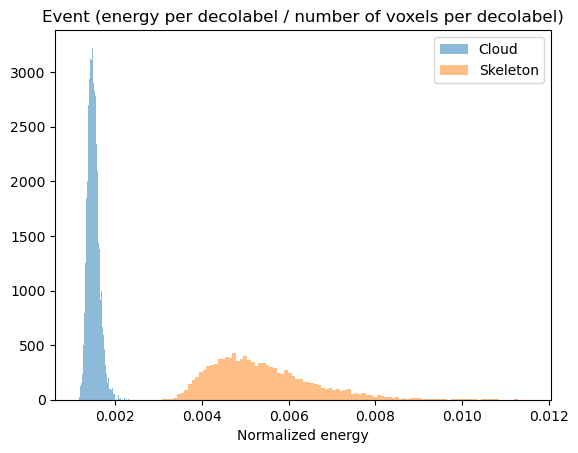

In [11]:
plt.hist(data_info[data_info.decolabel == 0].ratio_ene_vox, 100, density = True, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].ratio_ene_vox, 100, density = True, alpha = 0.5, label = 'Skeleton')
# plt.hist(data_info.groupby('dataset_id').sum().decoener / data_info.groupby('dataset_id').sum().deconvox, 90, density=True, alpha = 0.5, label = 'All') 
plt.title('Event (energy per decolabel / number of voxels per decolabel)')
plt.xlabel('Normalized energy')
# plt.yscale('log')
plt.legend()
plt.show()

In [12]:
data_info[data_info.decolabel == 1].ratio_ene_vox.min()

0.0029987463673143773

Si promediamos la energía por el número de voxeles que tiene cada decolabel, vemos una clara diferenciación. La media de energía de los voxeles de traza es como mínimo 0.003 (en energía normalizada)

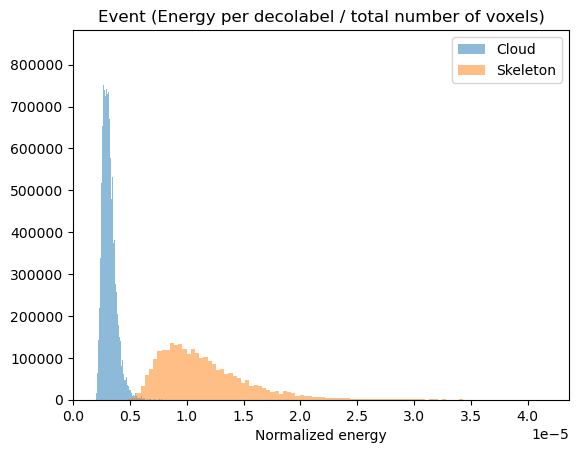

In [13]:
plt.hist(data_info[data_info.decolabel == 0].ratio_ene_vox / data_info.tot_vox, 100, density = True, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].ratio_ene_vox / data_info.tot_vox, 100, density = True, alpha = 0.5, label = 'Skeleton')
plt.title('Event (Energy per decolabel / total number of voxels)')
plt.xlabel('Normalized energy')
# plt.yscale('log')
plt.legend()
plt.show()

Si promediamos la energía de cada decolabel por el número de voxeles totales obtenemos mayor diferenciación que para el caso de sophronia con 4 bar

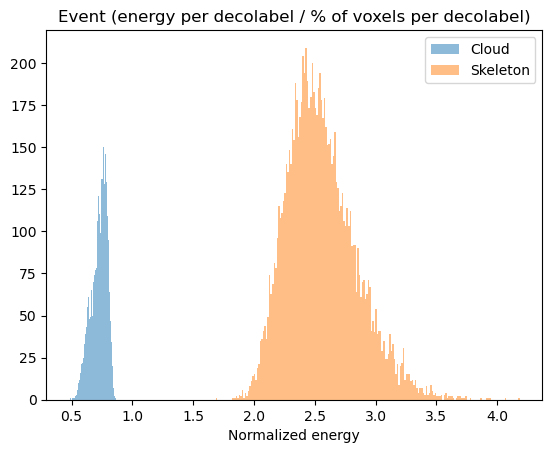

In [14]:
plt.hist(data_info[data_info.decolabel == 0].decoener / data_info[data_info.decolabel == 0].norm_nvox, 200, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].decoener / data_info[data_info.decolabel == 1].norm_nvox, 200, alpha = 0.5, label = 'Skeleton')
plt.title('Event (energy per decolabel / % of voxels per decolabel)')
plt.xlabel('Normalized energy')
# plt.yscale('log')
plt.legend()
plt.show()

Este es un poco similar al que ya vimos antes con bastante separación (el de energy per decolabel / nvoxels per decolabel), pero aquí al haber dividido por el número de voxeles normalizado, la distribución para skeleton se estrecha todavía más en lugar de ser tan ancha y tener una cola larga.

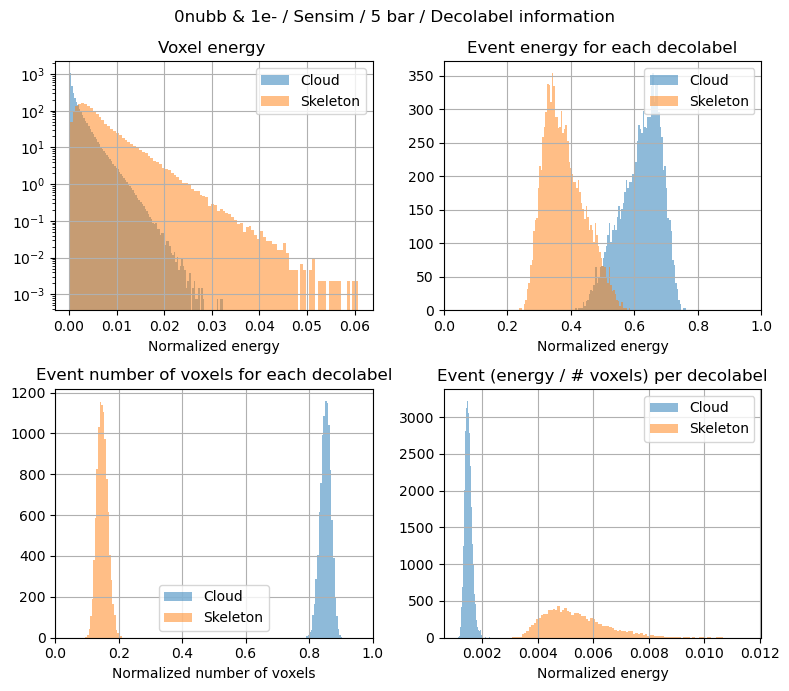

In [18]:
plt.figure(figsize = (8, 7))
plt.suptitle('0nubb & 1e- / Sensim / 5 bar / Decolabel information')

plt.subplot(2, 2, 1)
plt.hist(events_voxel[events_voxel.decolabel == 0].energy, 100, density = True, alpha = 0.5, label = 'Cloud')
plt.hist(events_voxel[events_voxel.decolabel == 1].energy, 100, density = True, alpha = 0.5, label = 'Skeleton')
plt.title('Voxel energy ')
plt.xlabel('Normalized energy')
plt.grid()
plt.yscale('log')
plt.legend()

plt.subplot(2, 2, 2)
plt.hist(data_info[data_info.decolabel == 0].decoener, 80, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].decoener, 80, alpha = 0.5, label = 'Skeleton')
plt.title('Event energy for each decolabel')
plt.xlabel('Normalized energy')
plt.xlim((0, 1))
plt.legend()
plt.grid()

plt.subplot(2, 2, 3)
plt.hist(data_info[data_info.decolabel == 0].norm_nvox, 200, (0, 1), alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].norm_nvox, 200, (0, 1), alpha = 0.5, label = 'Skeleton')
plt.grid()
plt.xlim((0, 1))
plt.title('Event number of voxels for each decolabel')
plt.xlabel('Normalized number of voxels')
plt.legend()


plt.subplot(2, 2, 4)
plt.hist(data_info[data_info.decolabel == 0].ratio_ene_vox, 100, density = True, alpha = 0.5, label = 'Cloud')
plt.hist(data_info[data_info.decolabel == 1].ratio_ene_vox, 100, density = True, alpha = 0.5, label = 'Skeleton')
# plt.hist(data_info.groupby('dataset_id').sum().decoener / data_info.groupby('dataset_id').sum().deconvox, 90, density=True, alpha = 0.5, label = 'All') 
plt.title('Event (energy / # voxels) per decolabel')
plt.xlabel('Normalized energy')
plt.grid()
# plt.yscale('log')
plt.legend()


plt.tight_layout()

### Train evolution

In [2]:
def plot_tb_results(file, title, figsize = (8, 7)):

    if isinstance(file, str):
        tb = load_tensorboard_df(file)
    if isinstance(file, list):
        tbs = [load_tensorboard_df(f) for f in file]
        for i in range(1, len(tbs)):
            tbs[i]['step'] += tbs[i-1]['step'].max() + 1
            tb = pd.concat(tbs, ignore_index=True)

    plt.figure(figsize = figsize)
    plt.suptitle(title)
    plt.subplot(2, 2, (1, 2))
    plt.plot(tb.step, tb.loss_train, label = 'Train')
    plt.plot(tb.step, tb.loss_valid, label = 'Valid')
    plt.grid()
    plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(tb.step, tb.iou_train_0class, label = 'Train')
    plt.plot(tb.step, tb.iou_valid_0class, label = 'Valid')
    plt.grid()
    # plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('IoU - Cloud')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(tb.step, tb.iou_train_1class, label = 'Train')
    plt.plot(tb.step, tb.iou_valid_1class, label = 'Valid')
    plt.grid()
    # plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('IoU - Skeleton')
    plt.legend()

    plt.tight_layout()
    return tb

In [4]:
tb_80kevs_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/pressure_topology/5bar/scn_sensim_trains/15mm_vox/deconv_unet_train/logs/events.out.tfevents.1742401454.c207-2.1858512.0'

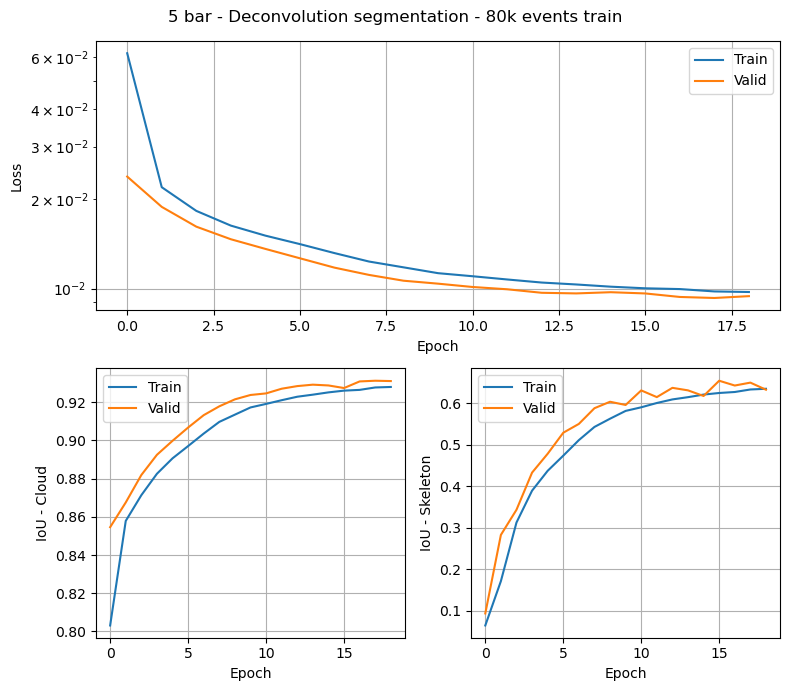

In [5]:
tb_100evs = plot_tb_results(tb_80kevs_file, '5 bar - Deconvolution segmentation - 80k events train')

In [ ]:
pred_file = '/mnt/lustre/scratch/nlsas/home/usc/ie/mpm/NEXT100/data/pressure_topology/5bar/scn_sensim_trains/15mm_vox/deconv_unet_train/pred_tst_file.h5'
prediction = pd.read_hdf(pred_file, 'DATASET/VoxelsPred')

In [11]:
# % of events with correct prediciton
thres = 0.5
((prediction.class_1 > thres).astype(int) == prediction.label).sum() / len(prediction)

0.9388422435164213

In [12]:
# % of events with cloud class
1 - sum(prediction.label) / len(prediction)

0.8518580105624021

### Plotting some results

In [25]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd

def plot_3d_hits(hits, value='energy', coords=['xbin', 'ybin', 'zbin'],
                  cmap=mpl.cm.jet, opacity=1, title = '', buffer=10, mc_hits=None, mc_hits_label = 'MC hits', voxel_info=None, frame_lims = None,cmlims = None, frameon = True, save_plot = False):
    if not isinstance(hits, pd.DataFrame):
        coor = np.array(hits).T
        hits = pd.DataFrame(coor, columns=coords + [value])
    df = hits.copy()
    # Reverse voxelization transformation
    if voxel_info is not None:
        size_x, size_y, size_z = voxel_info['size_x'].values[0], voxel_info['size_y'].values[0], voxel_info['size_z'].values[0]
        min_x, min_y, min_z = voxel_info['min_x'].values[0], voxel_info['min_y'].values[0], voxel_info['min_z'].values[0]

        df[coords[0]] = df[coords[0]] * size_x + min_x + size_x / 2
        df[coords[1]] = df[coords[1]] * size_y + min_y + size_y / 2
        df[coords[2]] = df[coords[2]] * size_z + min_z + size_z / 2

    xcoord = df[coords[0]].values
    ycoord = df[coords[1]].values
    zcoord = df[coords[2]].values
    content = df[value].values

    fig = plt.figure(figsize=(8, 8), frameon=frameon)
    gs = fig.add_gridspec(12, 12)
    ax = fig.add_subplot(gs[0:12, 0:10], projection='3d')
    axcb = fig.add_subplot(gs[1:11, 11])
    if cmlims: vmin, vmax = cmlims[0], cmlims[1]
    else: vmin, vmax = min(content), max(content)
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    ax.set_title(title)
    m = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    colors = np.asarray(np.vectorize(m.to_rgba)(content))
    colors = np.rollaxis(colors, 0, 2)

    ax.scatter(xcoord, ycoord, zcoord, c=colors * opacity, marker='o', label=None)

    # Set axis limits with buffer
    x_min, x_max = min(xcoord), max(xcoord)
    y_min, y_max = min(ycoord), max(ycoord)

    # Add MC hits if provided
    if mc_hits is not None:
        if not isinstance(mc_hits, pd.DataFrame):
            mc_hits = pd.DataFrame(np.array(mc_hits).T, columns=['x', 'y', 'z'])
        x_mc, y_mc, z_mc = mc_hits['x'], mc_hits['y'], mc_hits['z']
        ax.scatter(x_mc, y_mc, z_mc, c='red', marker='x', label=mc_hits_label)
        x_min, x_max = min(x_min, min(x_mc)), max(x_max, max(x_mc))
        y_min, y_max = min(y_min, min(y_mc)), max(y_max, max(y_mc))


    if frame_lims:
        (x_min, y_min, z_min), (x_max, y_max, z_max) = frame_lims        
        if voxel_info is not None:
            x_min, y_min, z_min = [(coord * size + min_val + size / 2) for coord, size, min_val in zip([x_min, y_min, z_min],[size_x, size_y, size_z], [min_x, min_y, min_z])]
            x_max, y_max, z_max = [(coord * size + min_val + size / 2) for coord, size, min_val in zip([x_max, y_max, z_max],[size_x, size_y, size_z], [min_x, min_y, min_z])]
        ax.set_zlim([z_min, z_max])

    ax.set_xlim([x_min - buffer, x_max + buffer])
    ax.set_ylim([y_min - buffer, y_max + buffer])

    cb = mpl.colorbar.ColorbarBase(axcb, cmap=cmap, norm=norm, orientation='vertical')

    ax.set_xlabel('X ')
    ax.set_ylabel('Y ')
    ax.set_zlabel('Z ')
    cb.set_label(value, size=15)
    cb.ax.tick_params(labelsize=13)
    cb.formatter.set_powerlimits((0, 0))
    # Show legend only if there are labels
    handles, labels = ax.get_legend_handles_labels()
    if labels:
        ax.legend()
    if not save_plot:
        plt.show()
    


In [26]:
dat_id = 0
thres = 0.5
event = prediction[prediction.dataset_id == dat_id].copy()
event['pred'] = (event.class_1 > thres).astype('int').values

In [27]:
evt_info = events_info[events_info.dataset_id == dat_id]
sensim_path = evt_info.pathname.values[0] + '/' + evt_info.basename.values[0]

hits = pd.read_hdf(sensim_path, 'MC/hits')
sns_hits = pd.read_hdf(sensim_path, 'Sensim/sns_df')
sns_vox = pd.read_hdf(sensim_path, 'Sensim/sns_vox_df')

In [28]:
nexus_event = hits[hits.event_id == evt_info.event.values[0]]
sns_event = sns_hits[sns_hits.event == evt_info.event.values[0]]

# these two should be the same (but with some columns more/missing), one coming from the sensim file and the other from the test file
sns_evt_vox = sns_vox[sns_vox.event == evt_info.event.values[0]] #from sensim file
evt_voxel = events_voxel[events_voxel.dataset_id == dat_id] #from test file

nexus


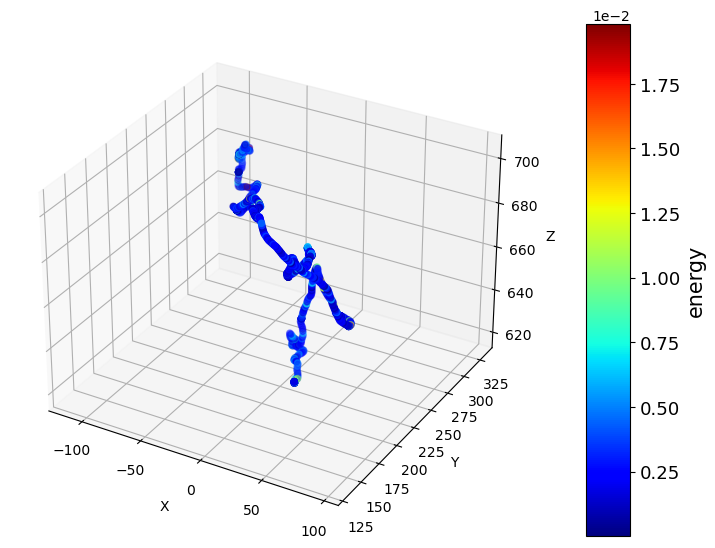

sensim hits


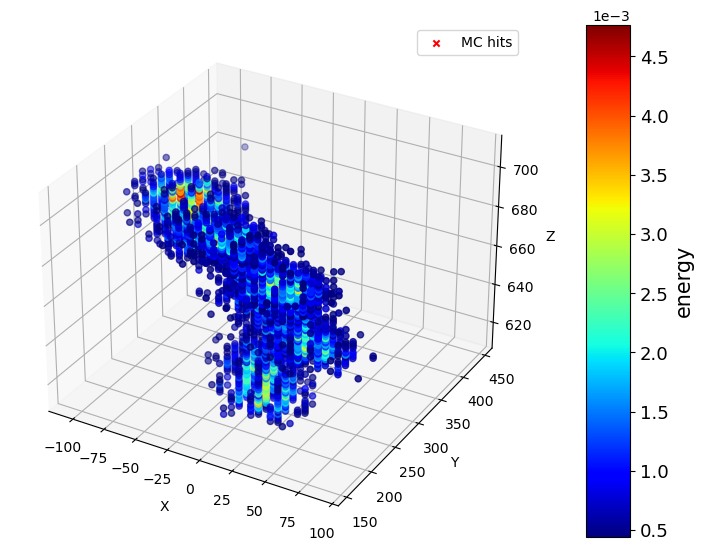

sensim voxels


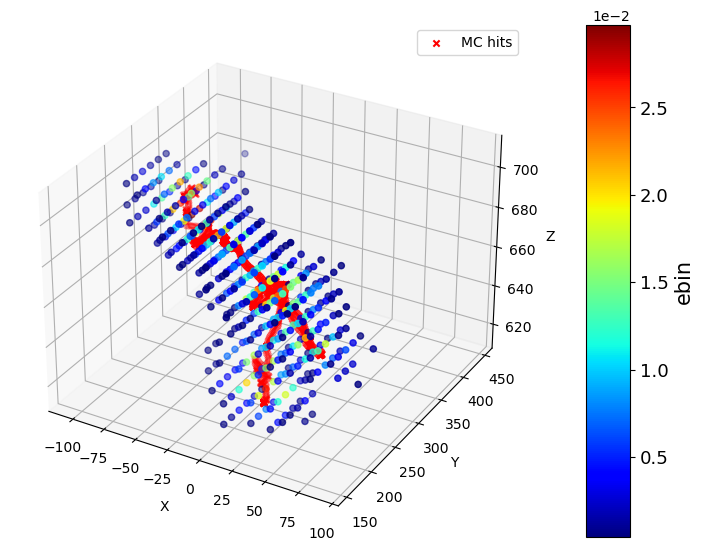

In [29]:
# SOURCE FILE
print('nexus')
plot_3d_hits(nexus_event, coords = ['x', 'y', 'z'], buffer = 50)
print('sensim hits')
plot_3d_hits(sns_event, coords = ['x_sipm', 'y_sipm', 'z_slice'], mc_hits=nexus_event)
print('sensim voxels')
plot_3d_hits(sns_evt_vox, 'ebin', coords = ['xbin', 'ybin', 'zbin'], mc_hits=nexus_event, voxel_info=bins_info)

sensim voxels


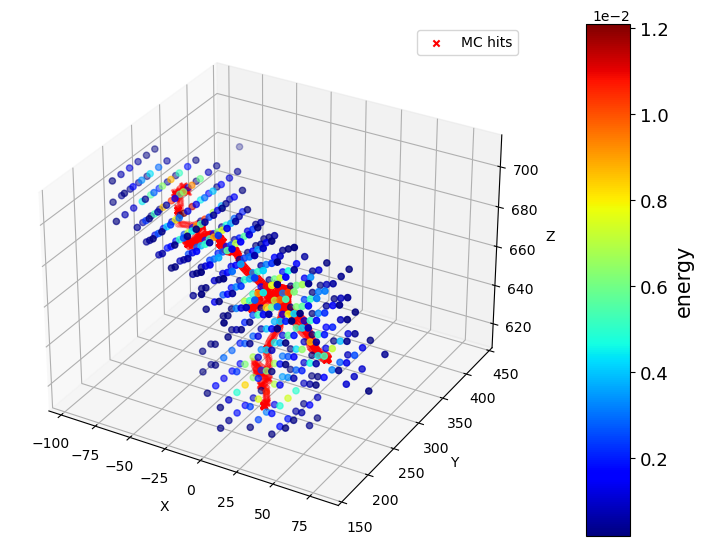

sensim label


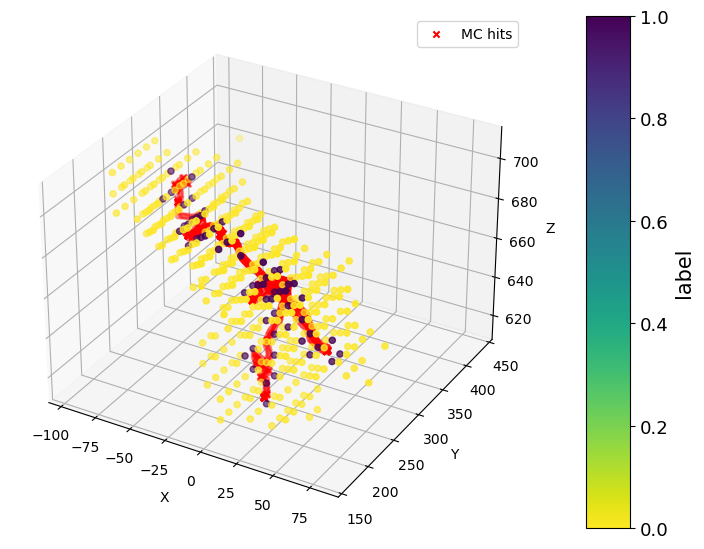

sensim class 1 score


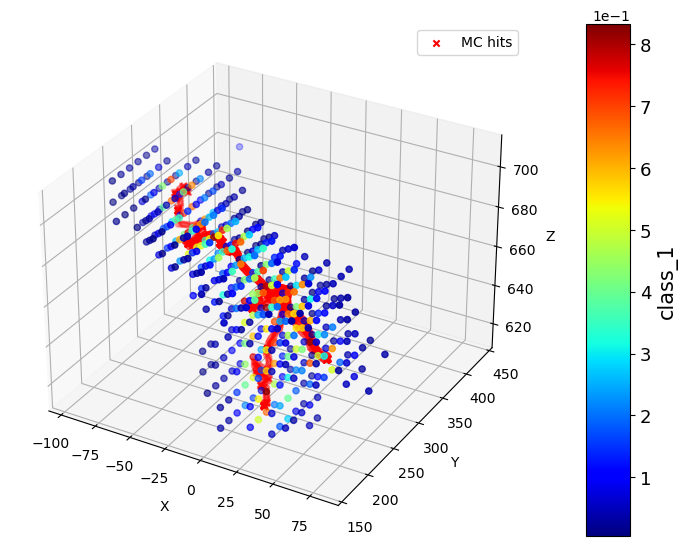

sensim class 1 score > 0.5


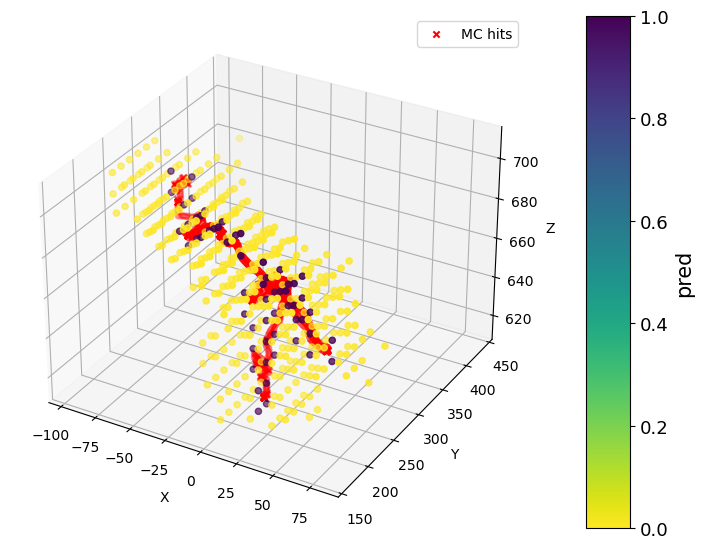

In [30]:
# PREDICTION FILE
print('sensim voxels')
plot_3d_hits(event, coords=['xbin', 'ybin', 'zbin'], buffer=0, mc_hits=nexus_event, voxel_info=bins_info)
print('sensim label')
plot_3d_hits(event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=0, mc_hits=nexus_event, voxel_info=bins_info)
print('sensim class 1 score')
plot_3d_hits(event, 'class_1', coords=['xbin', 'ybin', 'zbin'], buffer=0, mc_hits=nexus_event, voxel_info=bins_info)
print('sensim class 1 score > 0.5')
plot_3d_hits(event, 'pred', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], buffer=0, mc_hits=nexus_event, voxel_info=bins_info)

0.0


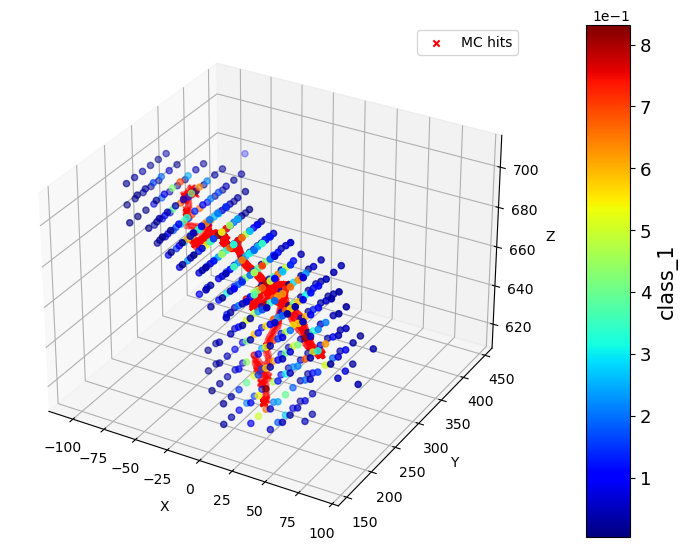

0.05


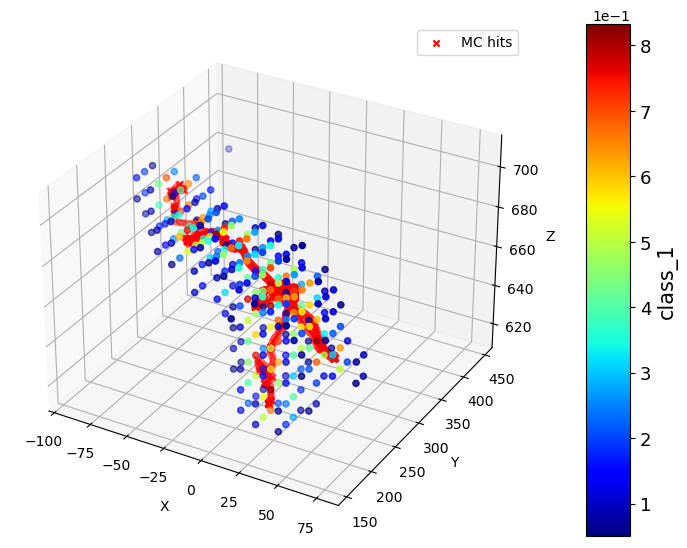

0.1


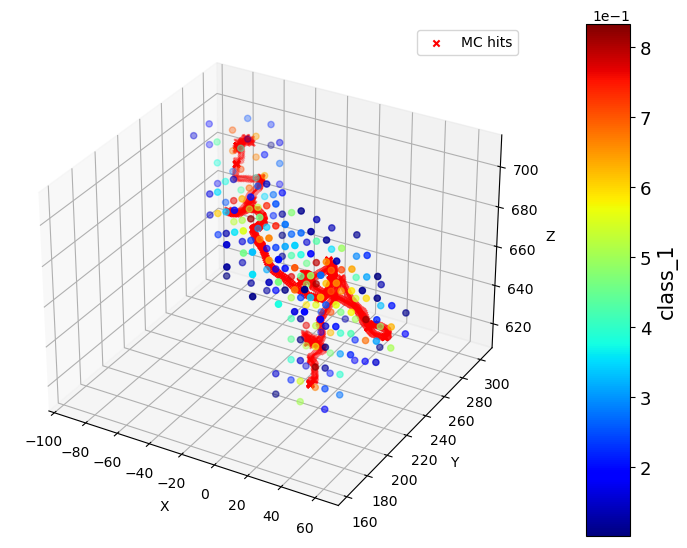

0.15000000000000002


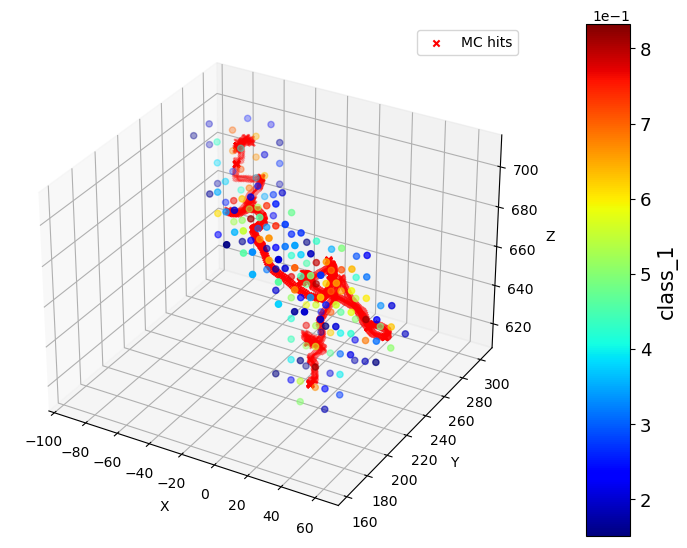

0.2


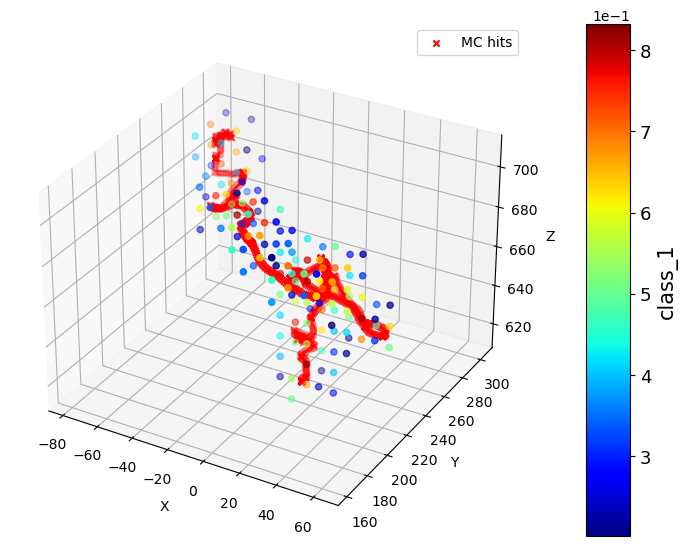

0.25


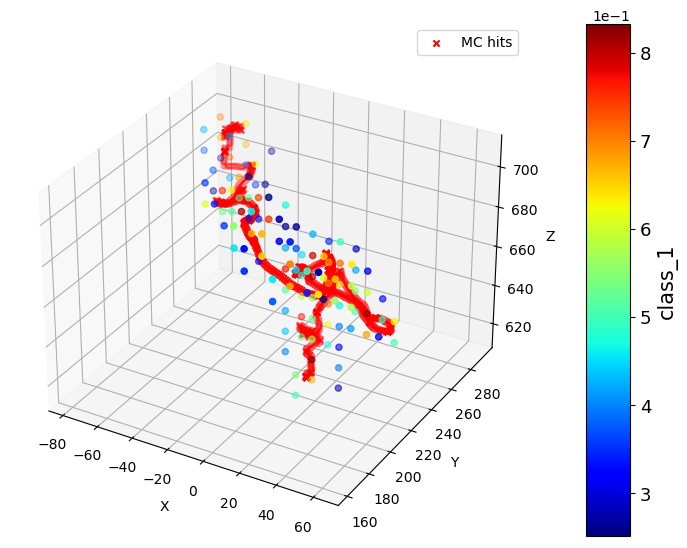

0.30000000000000004


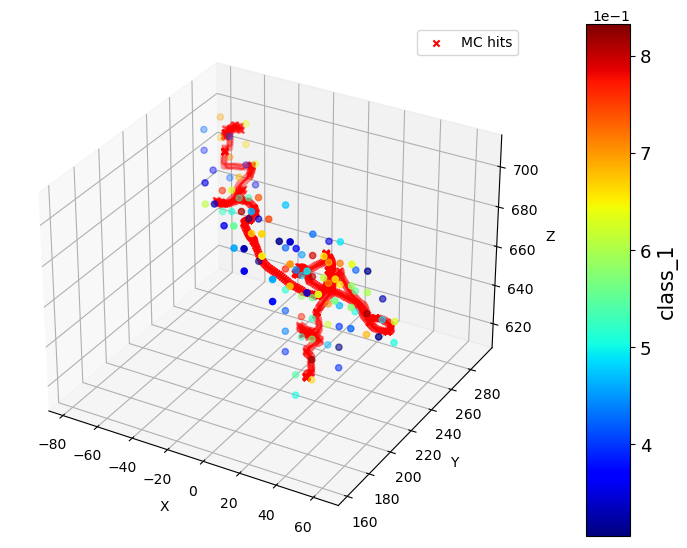

0.35000000000000003


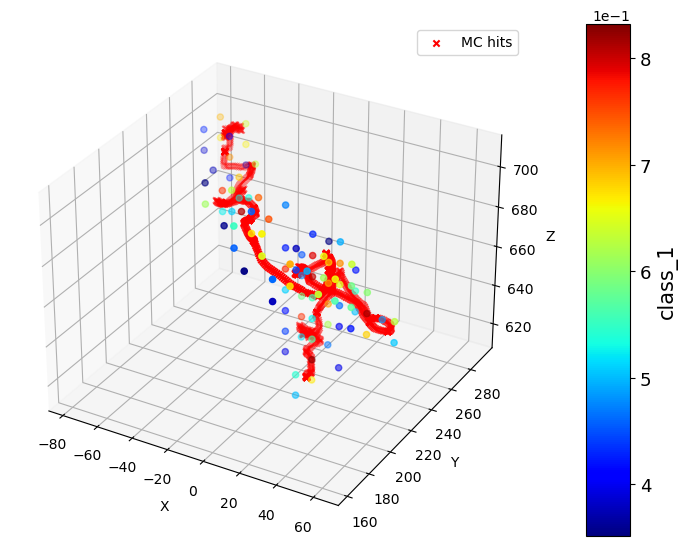

0.4


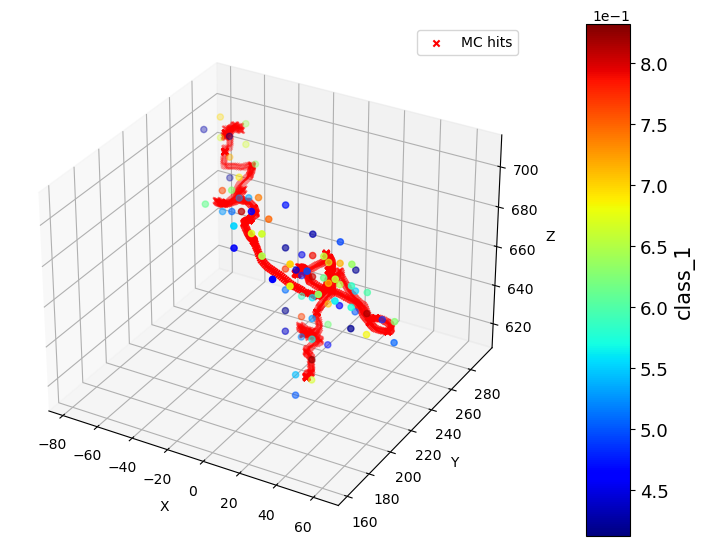

0.45


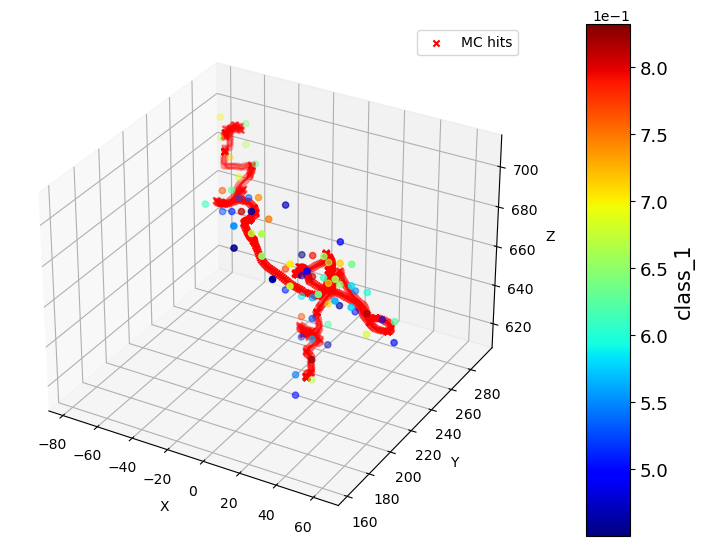

0.5


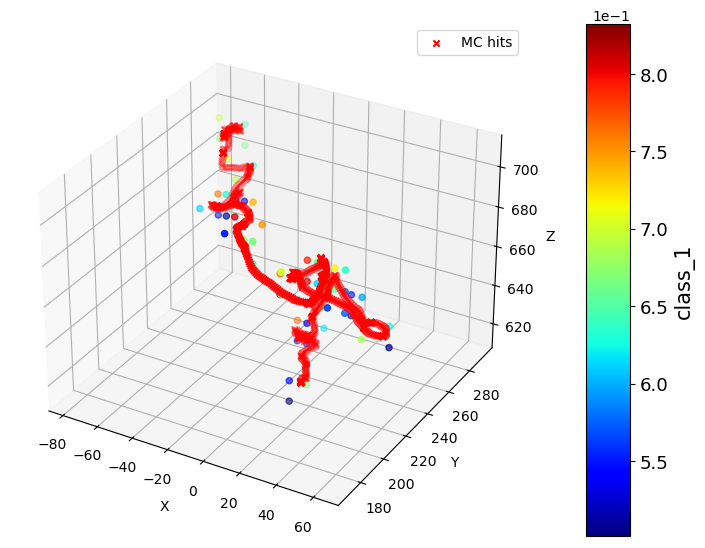

0.55


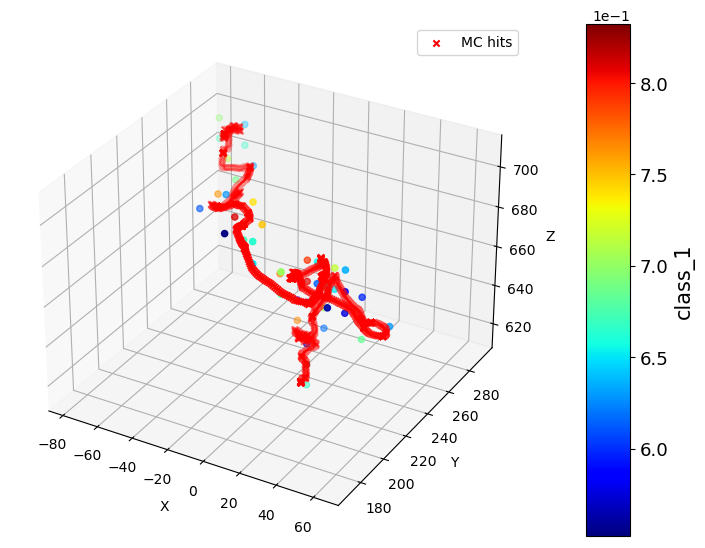

0.6000000000000001


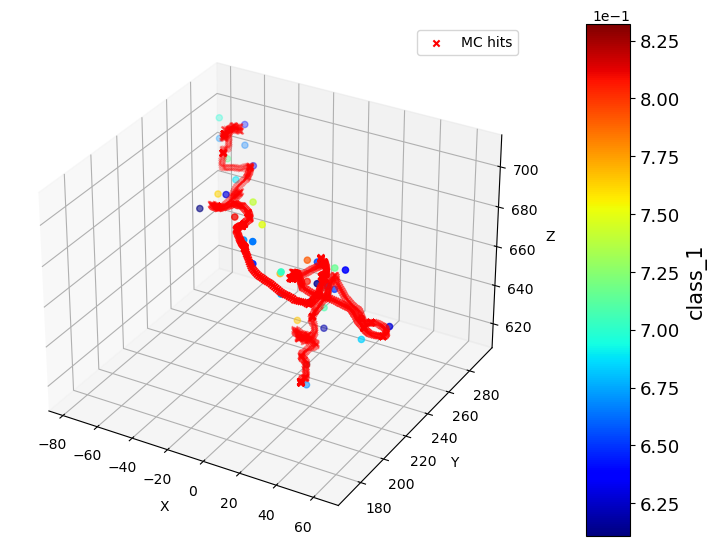

0.65


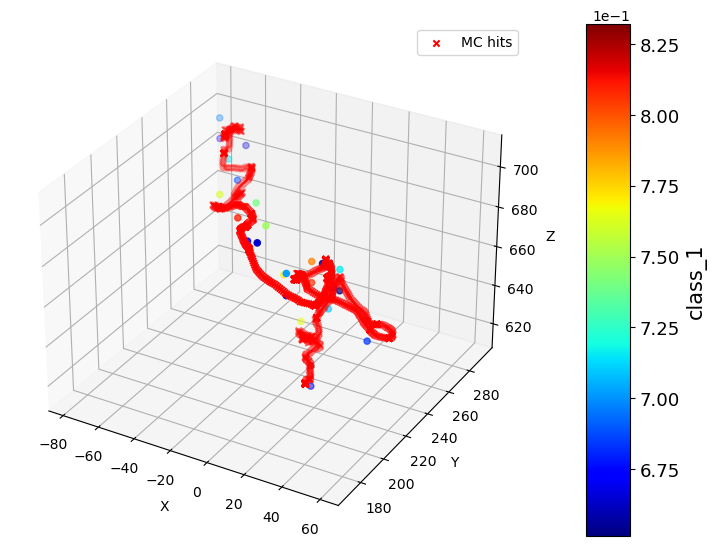

0.7000000000000001


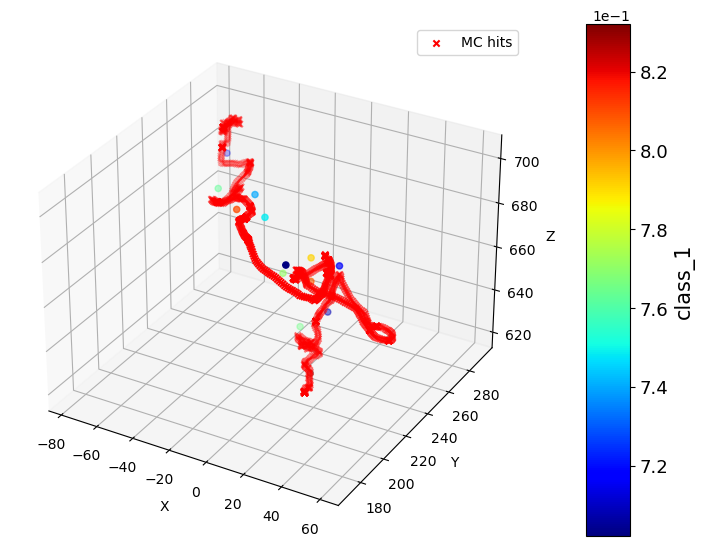

0.75


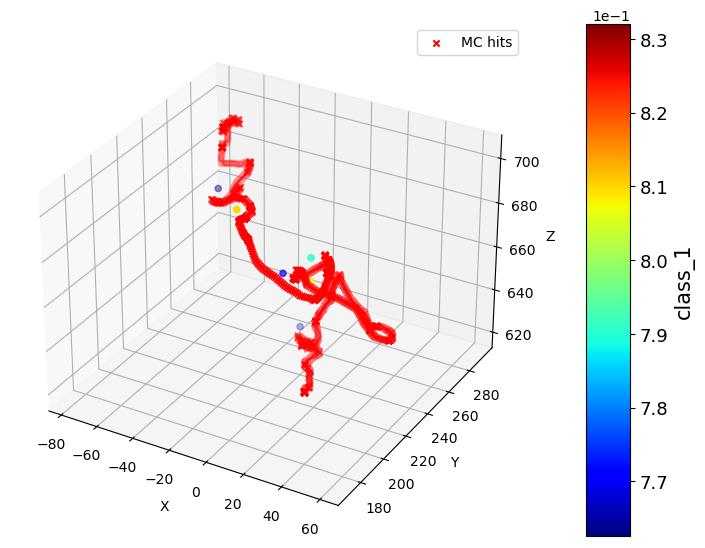

0.8


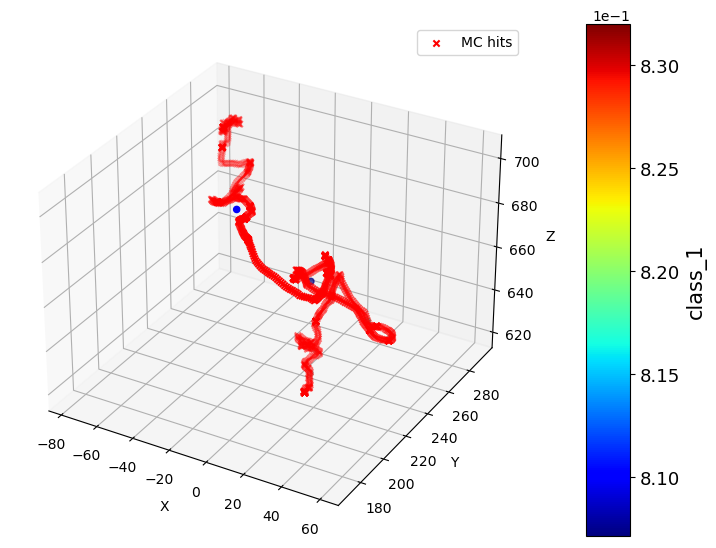

0.8500000000000001
No more hits with enough track score
0.9
No more hits with enough track score
0.9500000000000001
No more hits with enough track score


In [31]:
# loop to iteratively clean the track
frame_lims = event[['xbin', 'ybin', 'zbin']].min().values, event[['xbin', 'ybin', 'zbin']].max().values
for th in np.arange(0, 1, 0.05):
    print(th)
    clean_event = event[event.class_1 > th]
    if len(clean_event) > 0:
        plot_3d_hits(clean_event, 'class_1', coords=['xbin', 'ybin', 'zbin'], frame_lims=None, mc_hits = nexus_event, voxel_info=bins_info)
    else:
        print('No more hits with enough track score')

0.0


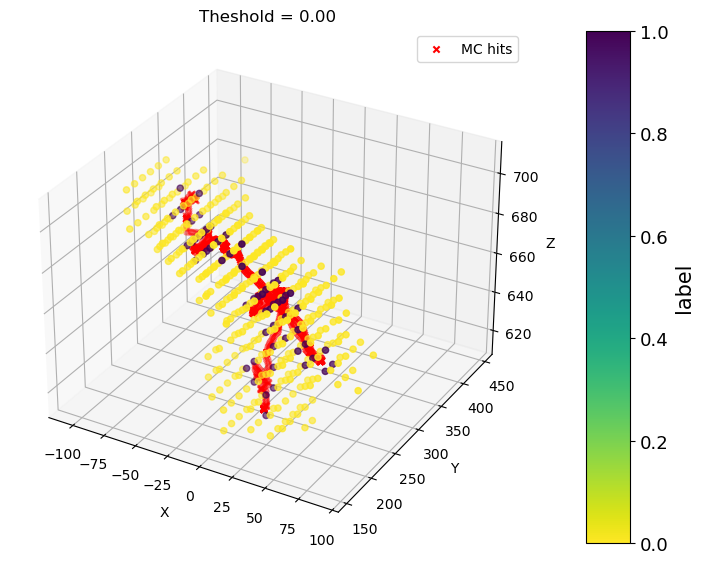

0.05


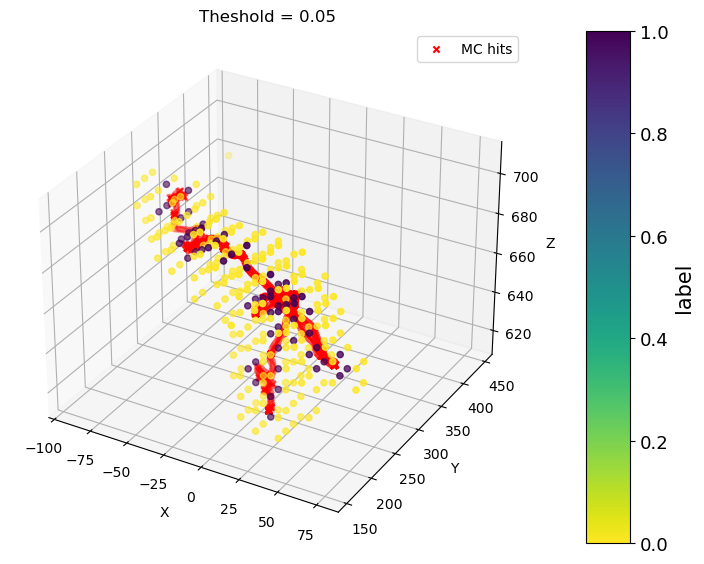

0.1


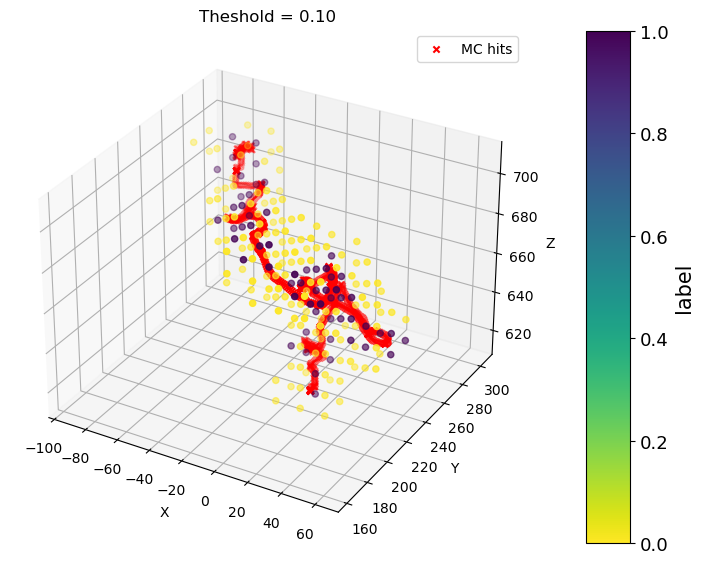

0.15000000000000002


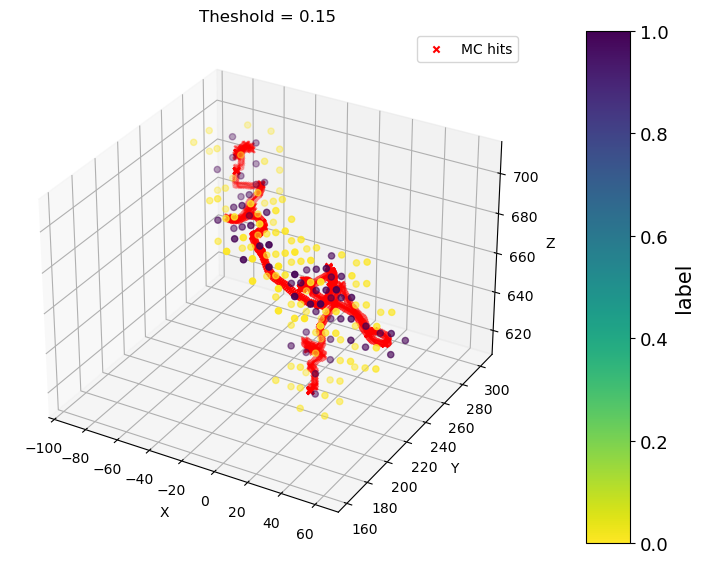

0.2


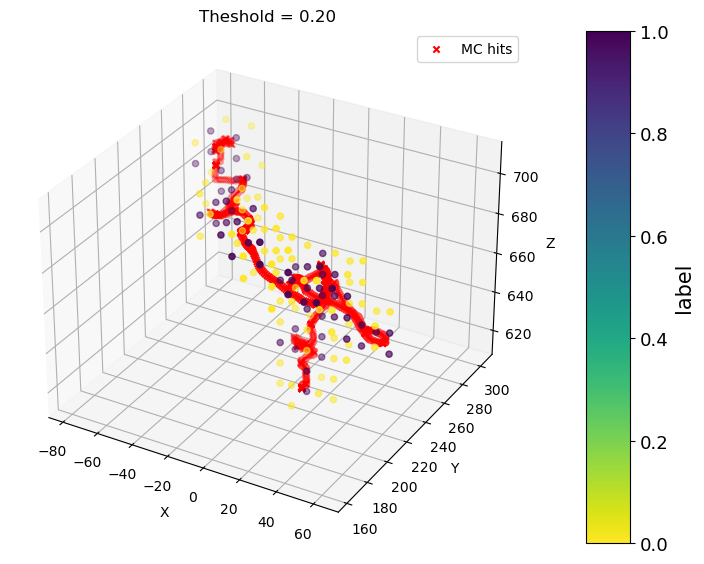

0.25


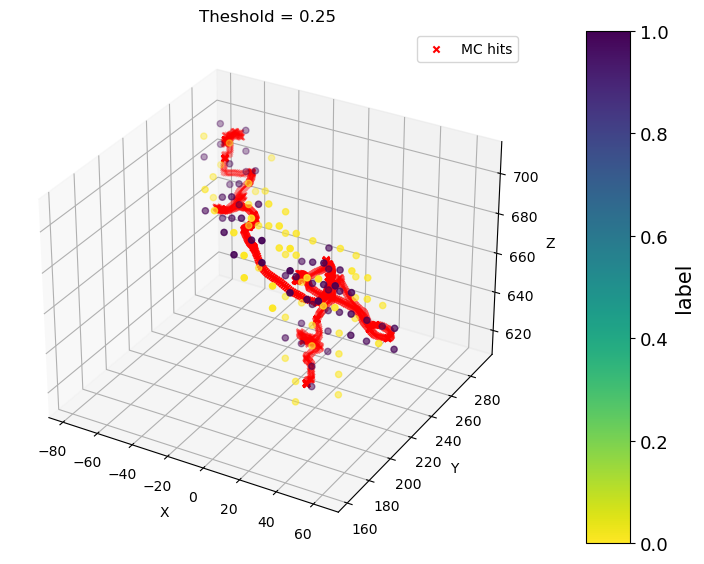

0.30000000000000004


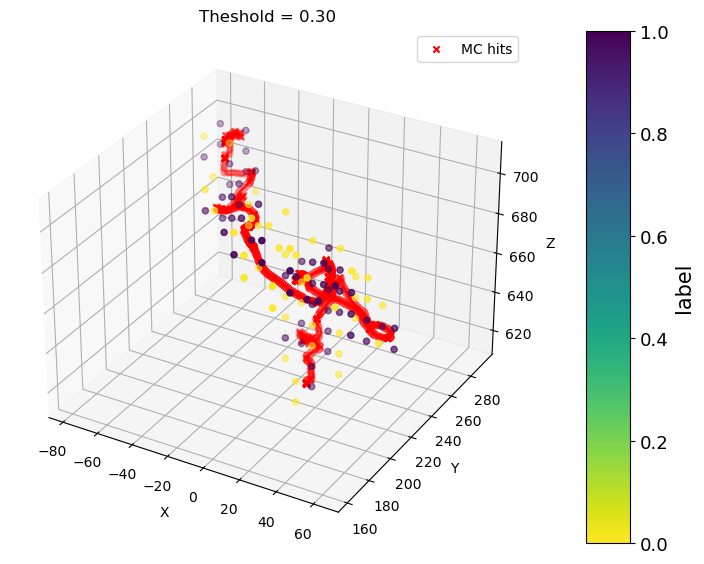

0.35000000000000003


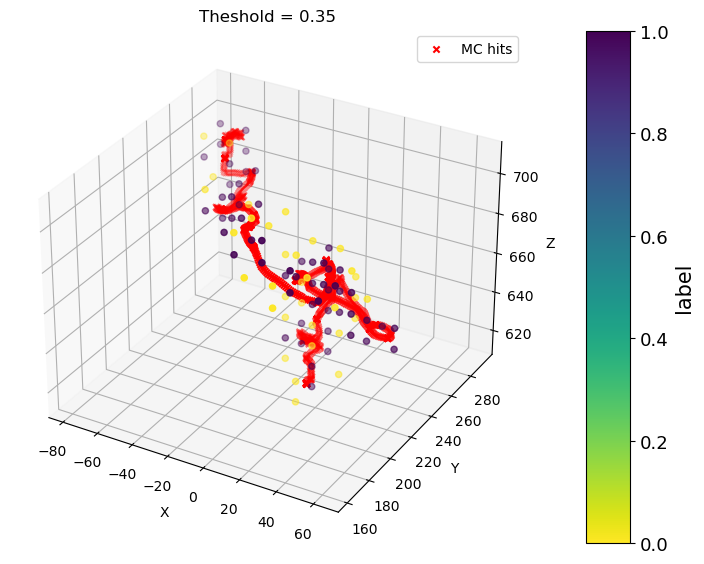

0.4


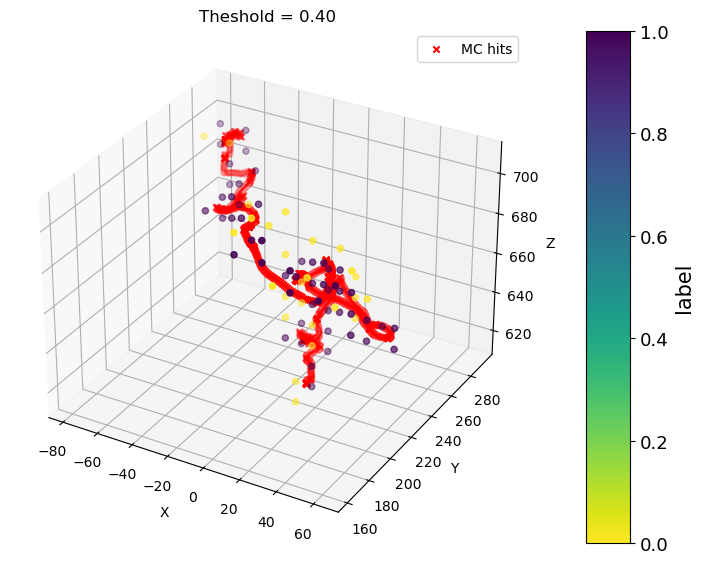

0.45


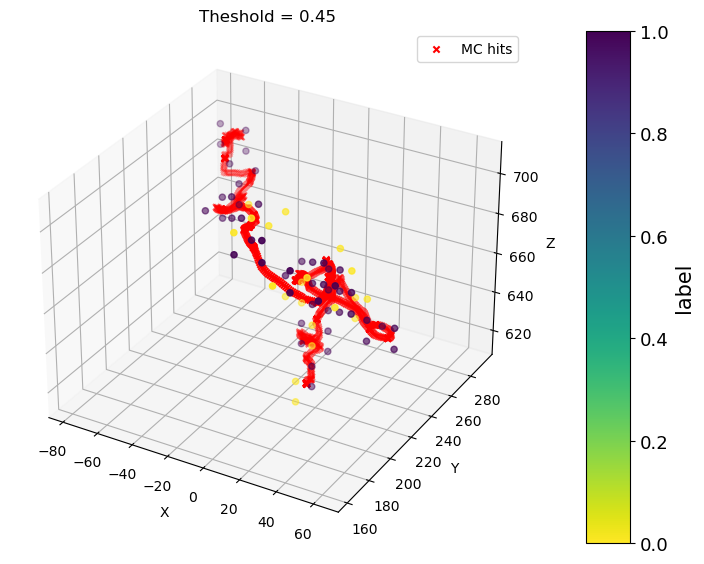

0.5


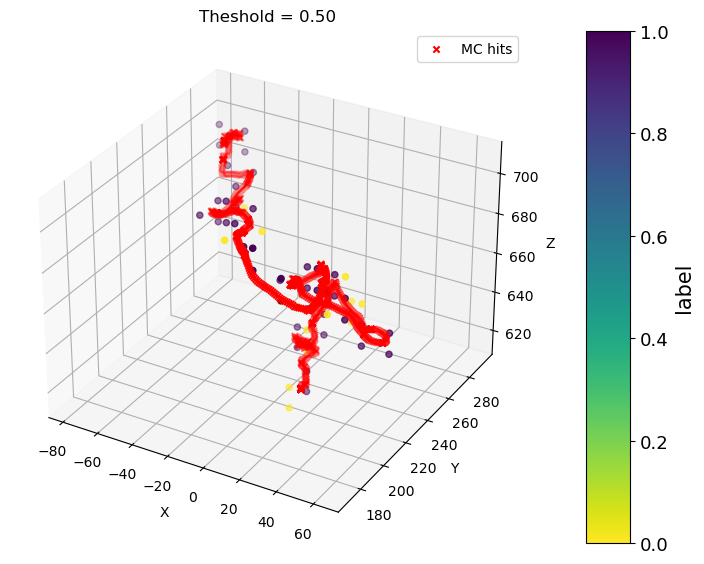

0.55


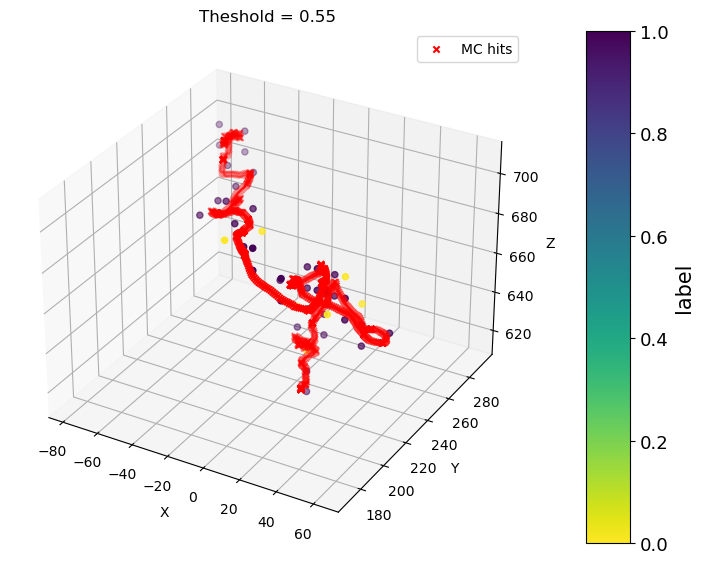

0.6000000000000001


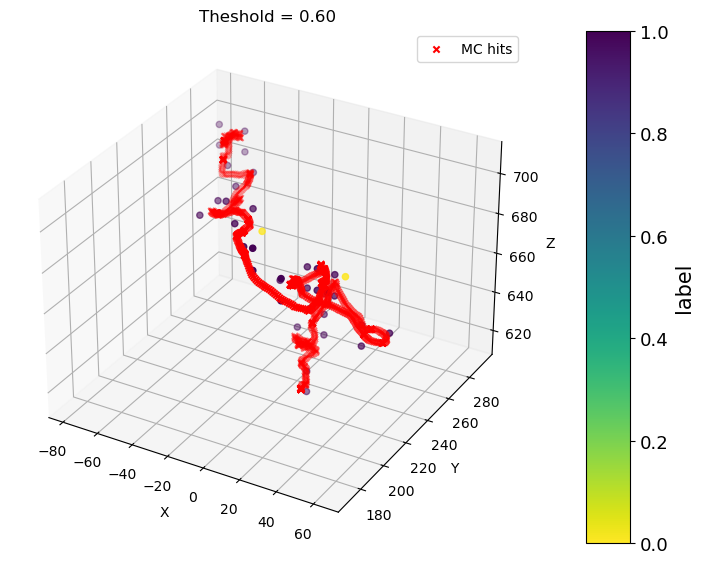

0.65


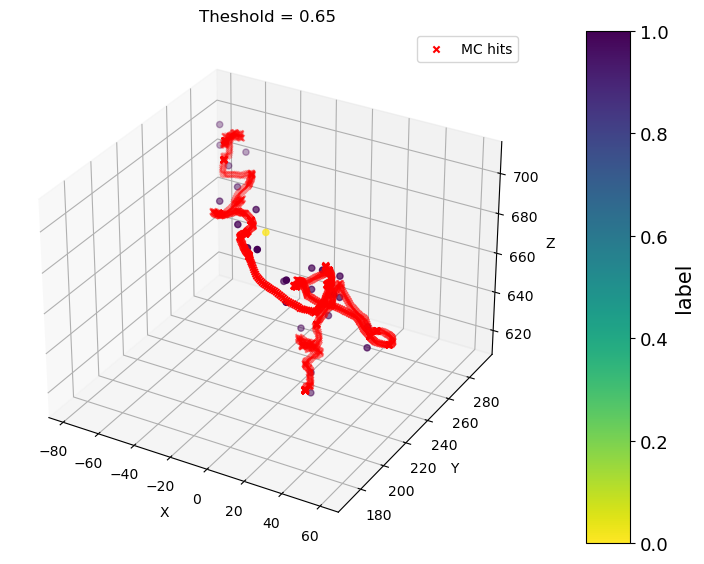

0.7000000000000001


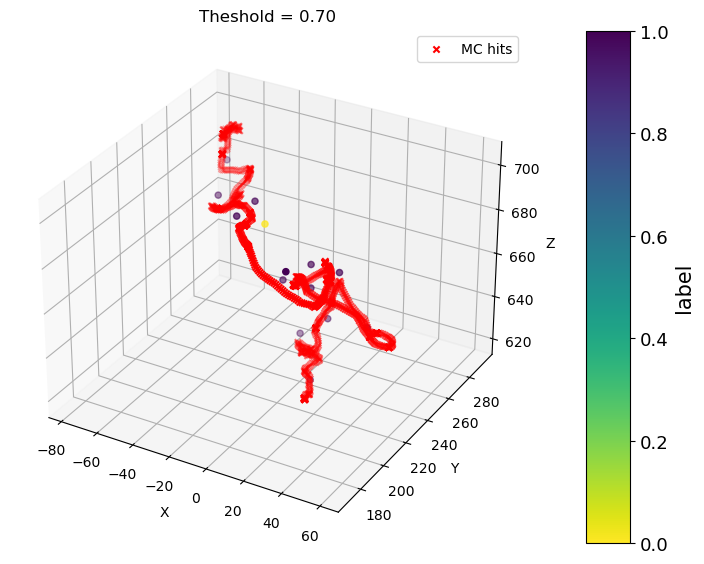

0.75


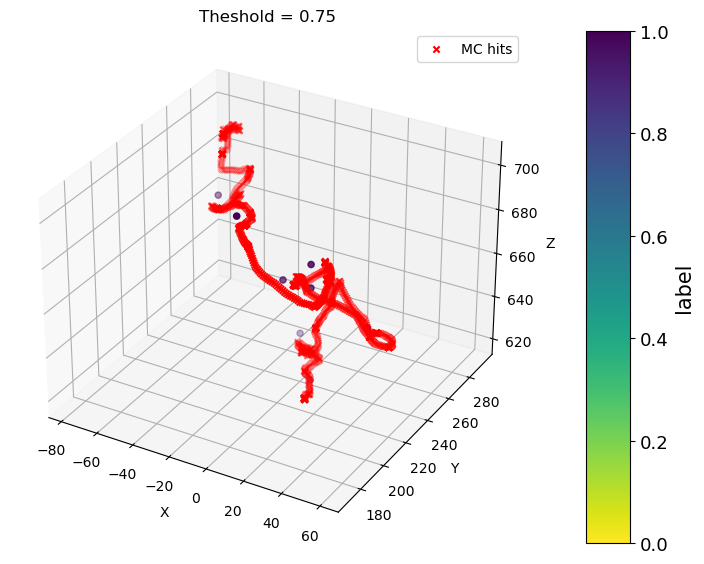

0.8


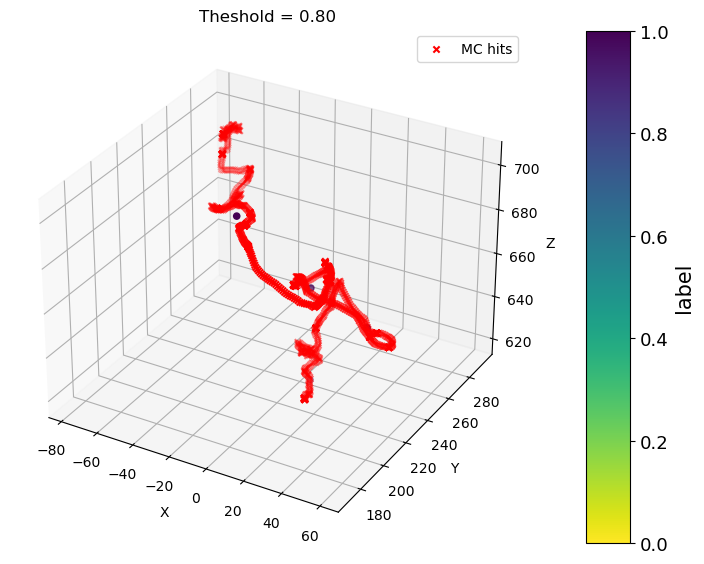

0.8500000000000001
No more hits with enough track score
0.9
No more hits with enough track score
0.9500000000000001
No more hits with enough track score


In [32]:
# loop to iteratively clean the track
image_paths = []
for idx, th in enumerate(np.arange(0, 1, 0.05)):
    print(th)
    clean_event = event[event.class_1 > th]
    if len(clean_event > 1):
        plot_3d_hits(clean_event, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1])
    else:
        print('No more hits with enough track score')

In [147]:
# ############# CREATE GIF ################
# # loop to iteratively clean the track
# frame_lims = event[['xbin', 'ybin', 'zbin']].min().values, event[['xbin', 'ybin', 'zbin']].max().values
# image_paths = []
# for idx, th in enumerate(np.arange(0, 1, 0.05)):
#     print(th)
#     clean_event = event[event.class_1 > th]
#     if len(clean_event > 1):
#         plot_3d_hits(clean_event, 'label', cmap=mpl.cm.cividis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=frame_lims, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1], save_plot=True)
#         frame_path = f"frames/frame_{idx:03d}.png"
#         plt.savefig(frame_path)
#         plt.close()
#         image_paths.append(frame_path)
#     else:
#         print('No more hits with enough track score')

# from PIL import Image

# frames = [Image.open(img) for img in image_paths]
# frames[0].save(
#     'track_evolution.gif', 
#     save_all=True, 
#     append_images=frames[1:], 
#     duration=500,  # Control speed (in ms)
#     loop=0          # Loop indefinitely
# )

### Metrics 

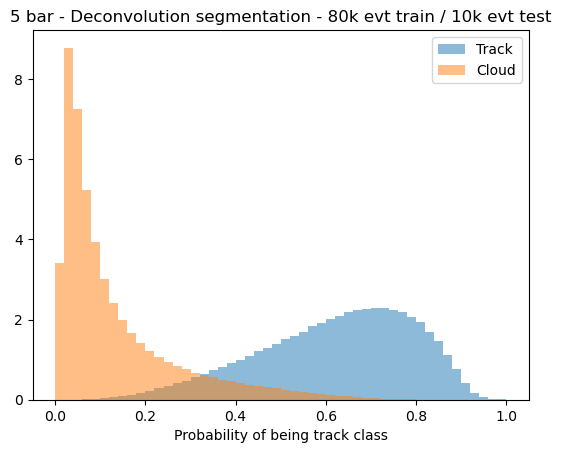

In [35]:
plt.hist(prediction[prediction.label == 1].class_1, 50, density=True, alpha = 0.5, label = 'Track')
plt.hist(prediction[prediction.label == 0].class_1, 50, density=True, alpha = 0.5, label = 'Cloud')
plt.xlabel('Probability of being track class')
plt.title('5 bar - Deconvolution segmentation - 80k evt train / 10k evt test')
plt.legend()
plt.show()

#### Intersection Over Union

- Metric for each of the classes, used when 2 classes are very unbalanced (in this case, class 0 has >90% of the voxels)
- We use the group of true voxels, and the group of predicted voxels
- The IoU is the intersection between the previous groups over the union of those
- This way we can check how class 1 performs, because it is the less common one.

In [34]:
import sys
from sklearn.metrics import confusion_matrix

def acc_and_IoU(true, pred, nclass = 2):
    """
        Intersection over union is a metric for semantic segmentation.
        It returns a IoU value for each class of our input tensors/arrays.
    """
    eps = sys.float_info.epsilon
    # conf_matrix = np.zeros((nclass, nclass))

    # for i in range(len(true)):
    #     conf_matrix[true[i]][pred[i]] += 1

    conf_matrix = confusion_matrix(true, pred)

    acc, IoU = [], []
    for i in range(nclass):
        acc.append((conf_matrix[i, i] + eps) / sum(conf_matrix[i, :]) + eps)
        IoU.append((conf_matrix[i, i] + eps) / (sum(conf_matrix[:, i]) + sum(conf_matrix[i, :]) - conf_matrix[i, i] + eps))
    total_acc = (sum(np.diagonal(conf_matrix)) + eps) / (sum(sum(conf_matrix)) + eps)
    return np.array(acc), total_acc, np.array(IoU)

In [36]:
thresholds = np.linspace(0, 1, 101)
acc, total_acc, iou = [], [], []
for th in thresholds:
    acc_, total_acc_, iou_ = acc_and_IoU(prediction.label.values, (prediction.class_1 > th).astype('int').values)
    acc.append(acc_)
    total_acc.append(total_acc_)
    iou.append(iou_)

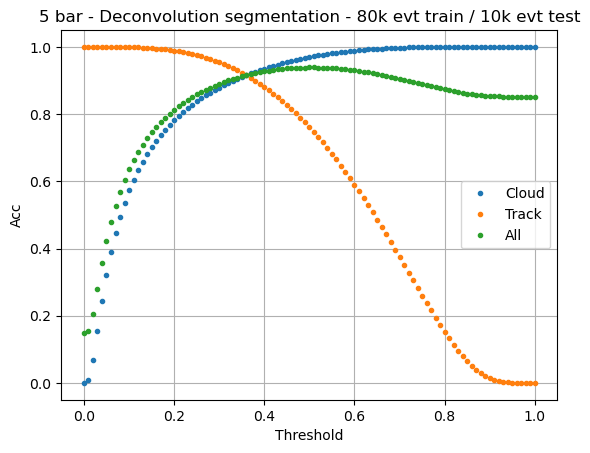

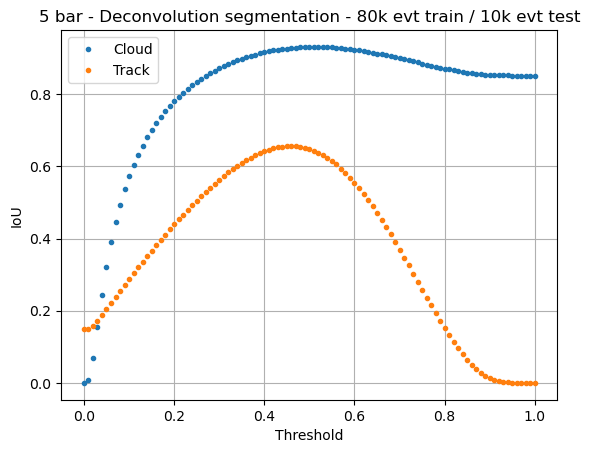

In [37]:
plt.plot(thresholds, np.array(acc)[:, 0], '.', label = 'Cloud')
plt.plot(thresholds, np.array(acc)[:, 1], '.', label = 'Track')
plt.plot(thresholds, np.array(total_acc), '.', label = 'All')
plt.legend()
plt.xlabel('Threshold')
plt.ylabel('Acc')
plt.title('5 bar - Deconvolution segmentation - 80k evt train / 10k evt test')
plt.grid()
plt.show()
plt.plot(thresholds, np.array(iou)[:, 0], '.', label = 'Cloud')
plt.plot(thresholds, np.array(iou)[:, 1], '.', label = 'Track')
plt.legend()
plt.xlabel('Threshold')
plt.ylabel('IoU')
plt.title('5 bar - Deconvolution segmentation - 80k evt train / 10k evt test')
plt.grid()
plt.show()

For the th = 0, the IoU of the class 1 is the % of the voxels of class 1 in the whole dataset:

In [38]:
prediction.label.sum() /len(prediction), iou[0][1]

(0.148141989437598, 0.148141989437598)

For the th = 1, the IoU of the class 0 is the % of the voxels of class 0 in the whole dataset:

In [39]:
1-(prediction.label.sum() /len(prediction)), iou[-1][0]

(0.8518580105624021, 0.8518580105624021)

#### Chamfer Distance 

The Chamfer Distance between two point clouds T and P is defined as:

$$
d_{\text{Chamfer}}(T, P) = \frac{1}{2|T|} \sum_{t \in T} \min_{p \in P} \| t - p \|^2
+ \frac{1}{2|P|} \sum_{p \in P} \min_{t \in T} \| p - t \|^2
$$

Where:
- T = Set of true voxels (label = 1)  
- P = Set of predicted voxels (score ≥ threshold)  
- |T| and |P| = Number of points in each set  
- Factor 1/2 to do the mean between the two directions


#### Hausdorff distance

The Hausdorff distance $d_H(T, P)$ between two sets T and P is defined as:

$$
d_H(T, P) = \max \left( \sup_{t \in T} \inf_{p \in P} \|t - p\|, \sup_{p \in P} \inf_{t \in T} \|p - t\| \right)
$$

Where:
- T and P are two non-empty subsets of a metric space.
- \|t - p\| is the distance between the points t and p (typically Euclidean distance).
- The supremum (\( \sup \)) is the least upper bound (maximum) of the infimum (\( \inf \)) distances from each point in one set to the nearest point in the other set. (It searchs for the smallest distance between every point (from T to P and back again) and selects the maximum of all those)
- Sometimes instead of choosing the maximum of both directions, a mean is done
- PENALIZES OUTLIERS / FALSE POSITIVE VOXELS FAR FROM THE TRUE TRACK


In [40]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

def compute_chamfer_and_hausdorff_distance(df, score_threshold=0.5):
    """
    """
    chamfer_results, hausdorff_results = [], []

    for dataset_id, group in df.groupby('dataset_id'):
        true_voxels = group[group['label'] == 1][['xbin', 'ybin', 'zbin']].values
        predicted_voxels = group[group['class_1'] >= score_threshold][['xbin', 'ybin', 'zbin']].values

        if len(true_voxels) == 0 or len(predicted_voxels) == 0:
            chamfer_distance, hausdorff_distance = np.inf, np.inf  # Handle edge case where one set is empty
        else:
            # KDTree for nearest neighbor queries
            true_tree = cKDTree(true_voxels)
            pred_tree = cKDTree(predicted_voxels)

            # True -> Predicted distances
            pred_to_true_distances, _ = pred_tree.query(true_voxels, k=1)
            mean_pred_to_true = np.mean(pred_to_true_distances**2)

            # Predicted -> True distances
            true_to_pred_distances, _ = true_tree.query(predicted_voxels, k=1)
            mean_true_to_pred = np.mean(true_to_pred_distances**2)

            # Average Chamfer Distance
            chamfer_distance = (mean_pred_to_true + mean_true_to_pred) / 2

            # Hausdorff Distance is the max of both directional distances
            hausdorff_distance = max(np.max(true_to_pred_distances), np.max(pred_to_true_distances))

        chamfer_results.append(chamfer_distance)
        hausdorff_results.append(hausdorff_distance)

    return chamfer_results, hausdorff_results


In [41]:
thresholds = np.linspace(0, 1, 101)
chamfer, hausdorff = [], []
mean_chamfer, mean_hausdorff = [], []
for th in thresholds:
    ch, ha = compute_chamfer_and_hausdorff_distance(prediction, score_threshold=th)
    chamfer.append(ch)
    hausdorff.append(ha)
    mean_chamfer.append(np.mean(ch))
    mean_hausdorff.append(np.mean(ha))

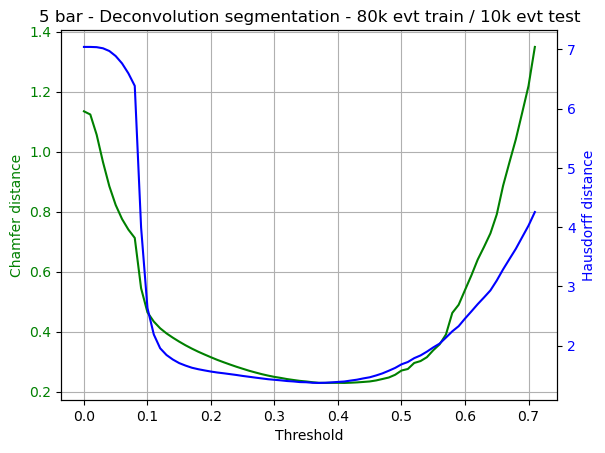

In [42]:
# Create the plot
fig, ax1 = plt.subplots()
plt.grid()
# Primary y-axis
ax1.plot(thresholds, np.array(mean_chamfer), 'g-')
ax1.set_xlabel('Threshold')
ax1.set_ylabel('Chamfer distance', color='g')
ax1.tick_params(axis='y', labelcolor='g')

# Secondary y-axis
ax2 = ax1.twinx()
ax2.plot(thresholds, np.array(mean_hausdorff), 'b-')
ax2.set_ylabel('Hausdorff distance', color='b')
ax2.tick_params(axis='y', labelcolor='b')

# # Adding legends
# ax2.legend(loc='upper right')

plt.title('5 bar - Deconvolution segmentation - 80k evt train / 10k evt test')

plt.show()

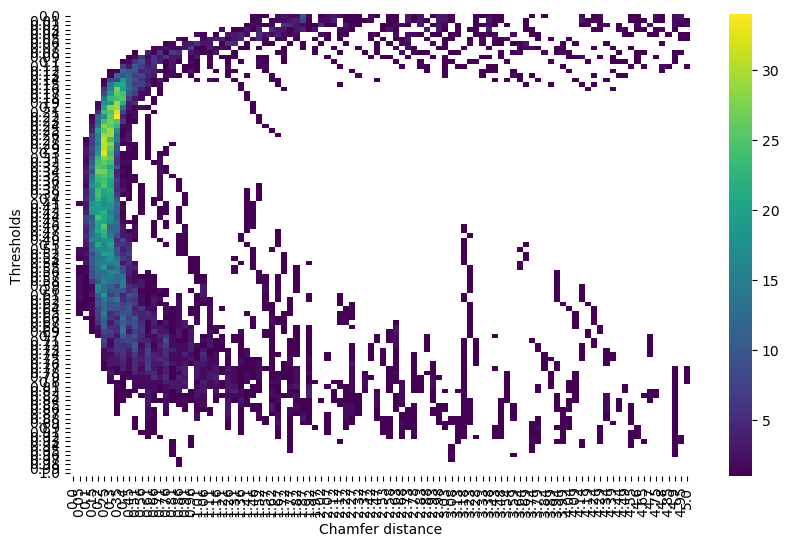

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


max_val = 5 #max(np.array(chamfer)[np.isfinite(np.array(chamfer))])
# Binning data
num_bins = 100
binned_data = [np.histogram(d, bins=num_bins, range=(0, max_val))[0] for d in chamfer]

# Convert to heatmap array
heatmap_data = np.array(binned_data)  # Transpose to match axes
mask = (heatmap_data == 0)
# Plotting
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='viridis', mask = mask, yticklabels=np.round(thresholds, 2), 
            xticklabels=np.round(np.linspace(0, max_val, num_bins), 2))
plt.ylabel('Thresholds')
plt.xlabel('Chamfer distance')
plt.title('')
plt.show()


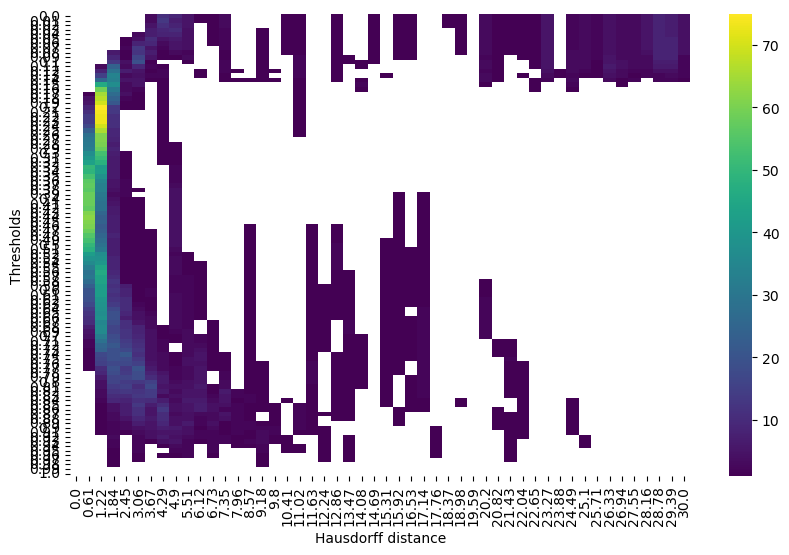

In [142]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


max_val = 30 #max(np.array(chamfer)[np.isfinite(np.array(chamfer))])
# Binning data
num_bins = 50
binned_data = [np.histogram(d, bins=num_bins, range=(0, max_val))[0] for d in hausdorff]

# Convert to heatmap array
heatmap_data = np.array(binned_data)  # Transpose to match axes
mask = (heatmap_data == 0)
# Plotting
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='viridis', mask = mask, yticklabels=np.round(thresholds, 2), 
            xticklabels=np.round(np.linspace(0, max_val, num_bins), 2))
plt.ylabel('Thresholds')
plt.xlabel('Hausdorff distance')
plt.title('')
plt.show()

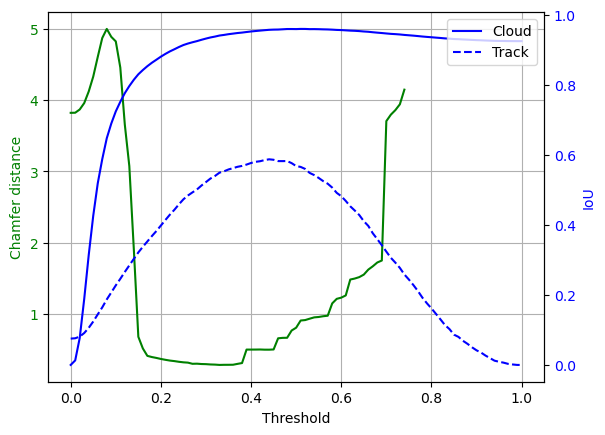

In [67]:
# Create the plot
fig, ax1 = plt.subplots()
plt.grid()
# Primary y-axis
ax1.plot(thresholds, np.array(mean_chamfer), 'g-')
ax1.set_xlabel('Threshold')
ax1.set_ylabel('Chamfer distance', color='g')
ax1.tick_params(axis='y', labelcolor='g')

# Secondary y-axis
ax2 = ax1.twinx()
ax2.plot(thresholds, np.array(iou)[:, 0], 'b-', label='Cloud')
ax2.plot(thresholds, np.array(iou)[:, 1], 'b--', label='Track')
ax2.set_ylabel('IoU', color='b')
ax2.tick_params(axis='y', labelcolor='b')

# Adding legends
ax2.legend(loc='upper right')

plt.title('')

plt.show()


### Recover the energy

Once the prediction is set, we got left with some voxels for each event that don't add up to one anymore. The way of proceeding would be re-normalizing them, so we could then just multiply by the total energy we had originally. This might be computationally slow because we have to reaccess all the data. I should maybe in the summary save the total energy of each event, so we don't need to come back for every event...

In [43]:
th = 0.48

final_pred = prediction[prediction.class_1 > th].copy()
final_pred['norm_energy'] = final_pred.groupby('dataset_id')['energy'].transform(lambda x: x / x.sum())

In [17]:
# pred_ev_info = events_info[np.isin(events_info.dataset_id, final_pred.dataset_id.unique())].copy()
# pred_sns_df = pd.read_hdf(pred_ev_info.pathname.unique()[0] + '/' + pred_ev_info.basename.unique()[0], 'Sensim/sns_vox_df')
# pred_ev_info = pred_ev_info.merge(pred_sns_df.groupby('event').ebin.sum(), on = 'event')

In [44]:
# final_pred['final_energy'] = final_pred['norm_energy'] * final_pred['dataset_id'].map(pred_ev_info.set_index('dataset_id')['ebin'])

final_pred['final_energy'] = final_pred['norm_energy'] * final_pred['dataset_id'].map(events_info.set_index('dataset_id')['total_energy'])

In [45]:
final_ev = final_pred[final_pred.dataset_id == dat_id]

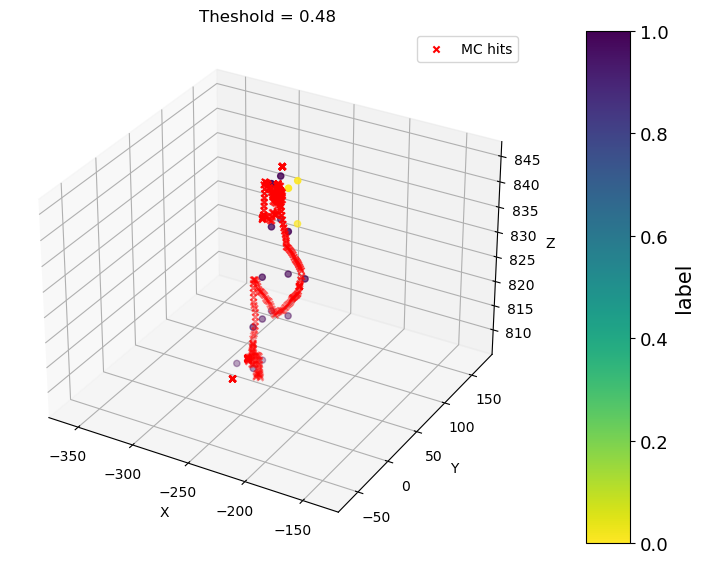

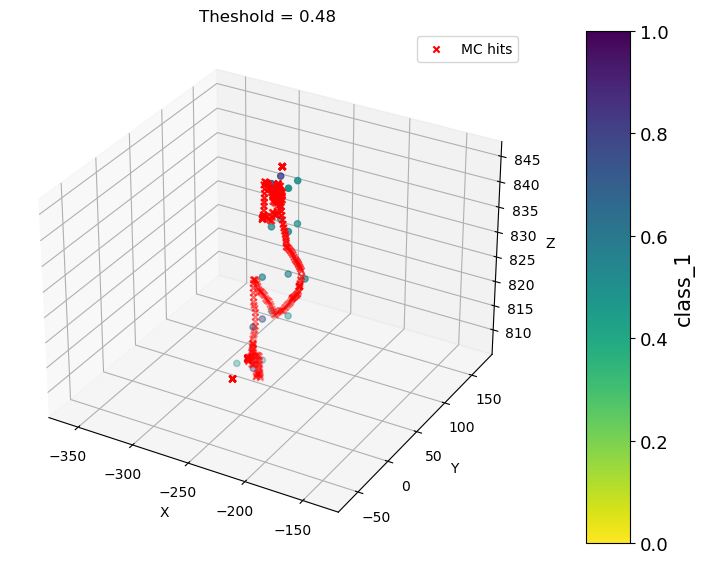

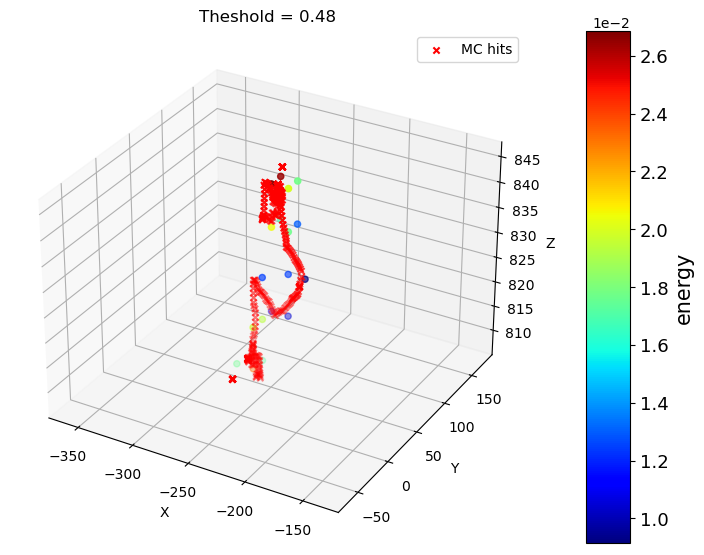

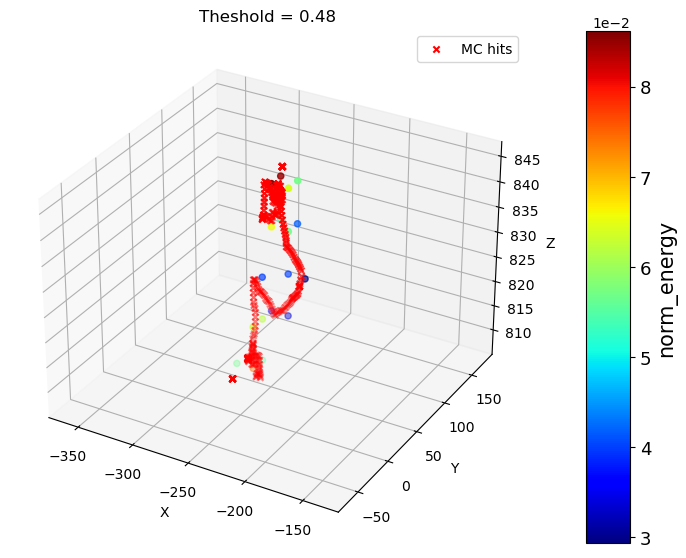

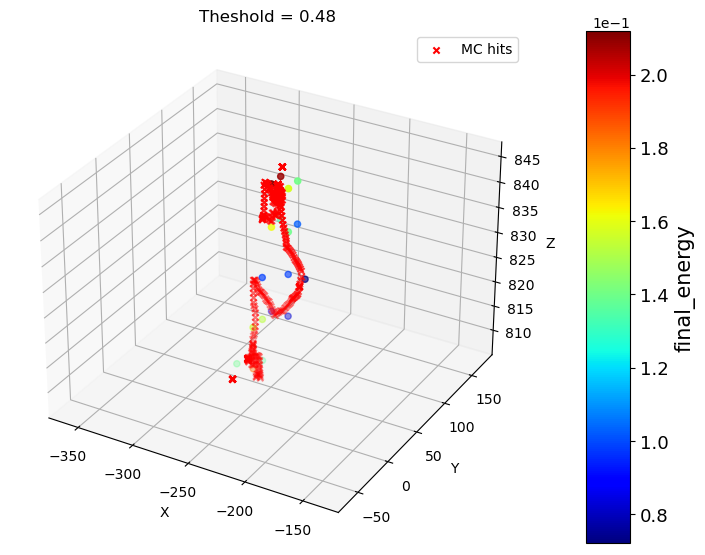

In [247]:
plot_3d_hits(final_ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1], buffer=100)
plot_3d_hits(final_ev, 'class_1', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, cmlims=[0, 1], buffer=100)
plot_3d_hits(final_ev, 'energy', cmap=mpl.cm.jet, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, buffer=100)
plot_3d_hits(final_ev, 'norm_energy', cmap=mpl.cm.jet, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, buffer=100)
plot_3d_hits(final_ev, 'final_energy', cmap=mpl.cm.jet, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Theshold = {th:.2f}',mc_hits = nexus_event, voxel_info=bins_info, buffer=100)

#### Skeletonize ??

In [79]:
import numpy as np
import pandas as pd
from skimage.morphology import skeletonize_3d
from scipy.ndimage import binary_dilation

def voxelize_data(df, grid_shape):
    """Converts a dataframe of points into a 3D binary voxel grid."""
    voxel_grid = np.zeros(grid_shape, dtype=bool)
    for _, row in df.iterrows():
        voxel_grid[int(row['xbin']), int(row['ybin']), int(row['zbin'])] = True
    return voxel_grid

def skeletonize_track(df, grid_shape):
    """Skeletonizes the 3D voxelized data."""
    voxel_grid = voxelize_data(df, grid_shape)
    skeleton = skeletonize_3d(voxel_grid)
    
    # Extract skeleton points as DataFrame
    skeleton_points = np.argwhere(skeleton)
    skeleton_df = pd.DataFrame(skeleton_points, columns=['x', 'y', 'z'])
    
    return skeleton_df

# Example DataFrame
df = final_ev.copy()

# Define voxel grid size (adjust to your dataset size)
grid_shape = (np.max(df['xbin']) + 1, 
               np.max(df['ybin']) + 1, 
               np.max(df['zbin']) + 1)

# Skeletonization
skeleton_df = skeletonize_track(df, grid_shape)

print(skeleton_df)


    x   y   z
0  16  36  97
1  17  37  98
2  17  38  99


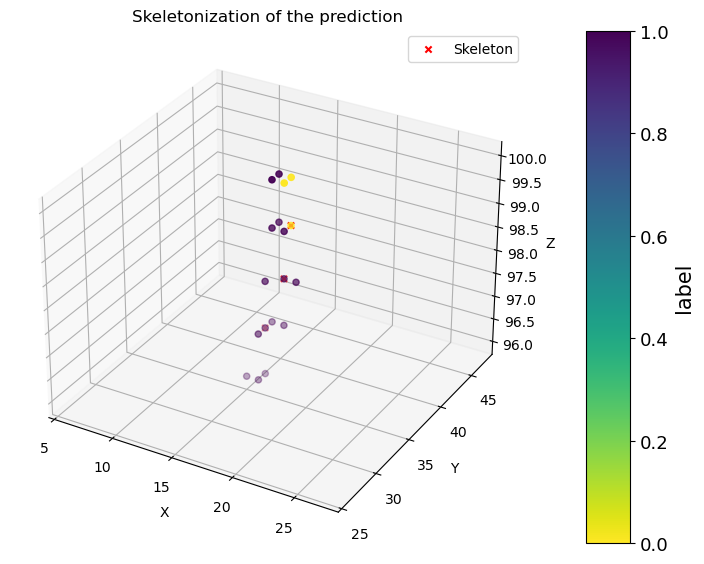

In [80]:
plot_3d_hits(final_ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Skeletonization of the prediction',mc_hits = skeleton_df, mc_hits_label = 'Skeleton', buffer=10)

In [82]:
def voxelize_data_(df):
    """Converts a dataframe of points into a 3D binary voxel grid."""
    grid_shape = (np.max(df['xbin']) + 1, np.max(df['ybin']) + 1, np.max(df['zbin']) + 1)
    voxel_grid = np.zeros(grid_shape)
    for _, row in df.iterrows():
        voxel_grid[int(row['xbin']), int(row['ybin']), int(row['zbin'])] = row['final_energy']
    return voxel_grid

In [115]:
from scipy import ndimage

scale = (3, 3, 1)

interp = ndimage.zoom(voxelize_data_(final_ev), scale, order=1)
# interp[np.isclose(interp, 0, atol=1e-2)] = 0
# interp[interp < 0] = 0

### Quizás interpolar solo en (x, y) para que no se acorte el extremo?? --> Visualmente parece que es mejor pero el skeleton como que no...

In [123]:
coords = np.array(np.nonzero(interp)).T #np.array([coord / scale[i] for i, coord in enumerate(np.nonzero(interp))]).T #divide by the scale to obtain the "voxel" position
df_interp = pd.DataFrame(coords, columns=['xbin', 'ybin', 'zbin'])
df_interp['ebin'] = interp[np.nonzero(interp)]

In [124]:
# Skeletonization
# Define voxel grid size (adjust to your dataset size)
grid_shape_int = (int(np.max(df_interp['xbin'])) + 1, 
               int(np.max(df_interp['ybin'])) + 1, 
               int(np.max(df_interp['zbin'])) + 1)
skeleton_interp_df = skeletonize_track(df_interp, grid_shape_int)
skeleton_interp_df = skeleton_interp_df.merge(df_interp.rename(columns = {'xbin':'x', 'ybin':'y', 'zbin':'z'}), on = ['x', 'y', 'z'])

In [126]:
for i, col in enumerate(skeleton_interp_df[['x', 'y', 'z']]):
    skeleton_interp_df[col] = skeleton_interp_df[col] / scale[i]

for i, col in enumerate(df_interp[['xbin', 'ybin', 'zbin']]):
    df_interp[col] = df_interp[col] / scale[i]

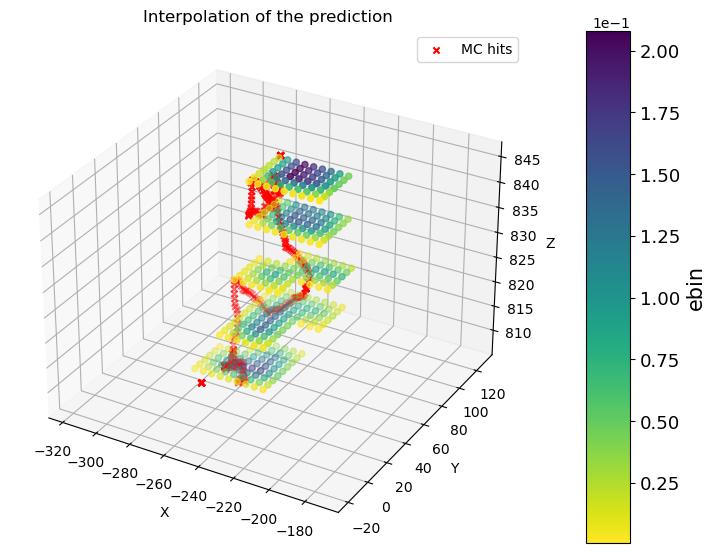

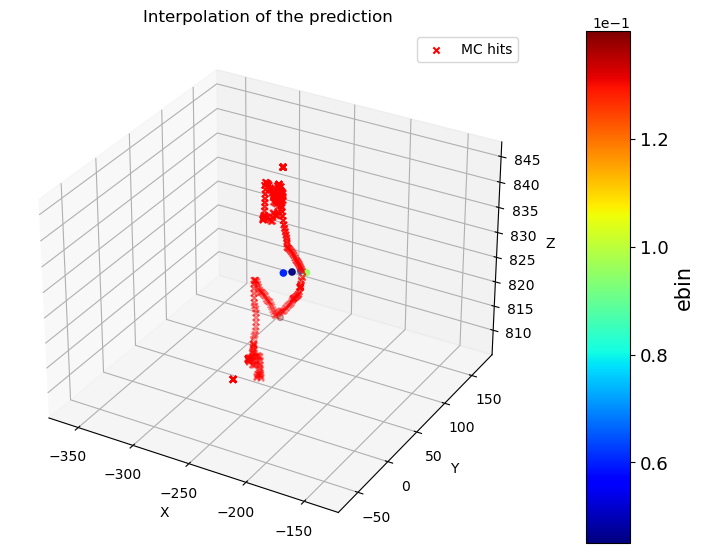

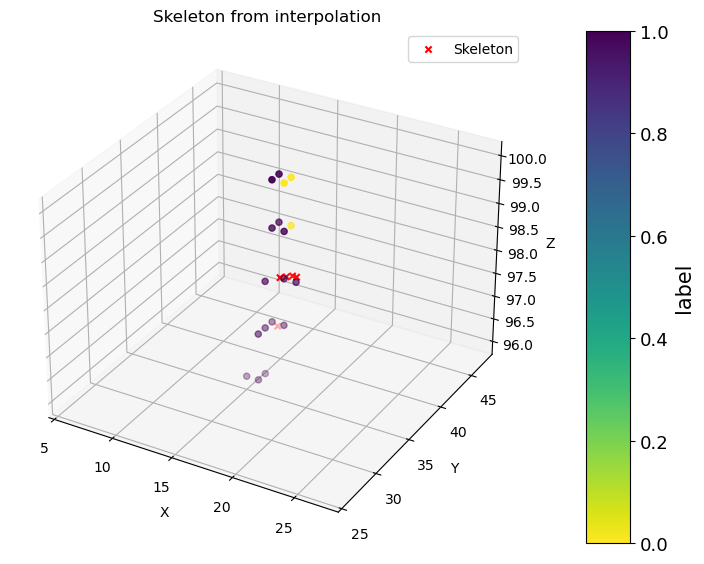

In [129]:
plot_3d_hits(df_interp, 'ebin', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Interpolation of the prediction',mc_hits=nexus_event, voxel_info=bins_info, buffer = 50)
plot_3d_hits(skeleton_interp_df, 'ebin', cmap=mpl.cm.jet, coords=['x', 'y', 'z'], frame_lims=None, title = f'Interpolation of the prediction',mc_hits=nexus_event, voxel_info=bins_info, buffer = 100)
plot_3d_hits(final_ev, 'label', cmap=mpl.cm.viridis_r, coords=['xbin', 'ybin', 'zbin'], frame_lims=None, title = f'Skeleton from interpolation',mc_hits = skeleton_interp_df, mc_hits_label='Skeleton', buffer=10)

In [20]:
event

,label,energy,dataset_id,xbin,ybin,zbin,class_0,class_1,pred
0,0,0.000143,0,12,35,96,0.972973,0.027027,0
1,0,0.000143,0,12,35,100,0.953918,0.046082,0
2,0,0.000179,0,12,36,99,0.978996,0.021004,0
3,0,0.000143,0,12,38,99,0.987636,0.012364,0
4,0,0.000143,0,13,33,96,0.966807,0.033193,0
...,...,...,...,...,...,...,...,...,...
274,0,0.000322,0,20,37,99,0.981233,0.018767,0
275,0,0.000179,0,20,38,99,0.985597,0.014403,0
276,0,0.000179,0,20,39,98,0.972112,0.027888,0
277,0,0.000143,0,21,36,100,0.993915,0.006085,0


In [23]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
from ipywidgets import interact, FloatSlider, fixed

# Sample Data
np.random.seed(42)
data = pd.DataFrame({
    'x': np.random.rand(100) * 10,
    'y': np.random.rand(100) * 10,
    'z': np.random.rand(100) * 10,
    'A': np.random.rand(100) * 100
})

# Function to plot with additional arguments
def plot_3d(threshold, df, variable='label', threshold_variable = 'class_1'):
    filtered_data = df[df[threshold_variable] > threshold]

    fig = go.Figure(data=go.Scatter3d(
        x=filtered_data['xbin'],
        y=filtered_data['ybin'],
        z=filtered_data['zbin'],
        mode='markers',
        marker=dict(
            size=3,
            color=filtered_data[variable],
            colorscale='Viridis',
            colorbar=dict(title='variable')
        )
    ))

    fig.update_layout(
        margin=dict(l=0, r=0, b=0, t=40),
        title=f'3D Scatter Plot with Threshold > {threshold}'
    )

    fig.show()

# Slider and Interaction
interact(
    plot_3d, 
    threshold=FloatSlider(min=0, max=1, step=0.1, value=0),
    df=fixed(event),          # Pass the DataFrame as a fixed variable
    variable=['label', 'energy', 'class_1'],  # Dropdown for variable shown
    threshold_variable = 'class_1'
)




interactive(children=(FloatSlider(value=0.0, description='threshold', max=1.0), Dropdown(description='variable…

<function __main__.plot_3d(threshold, df, variable='label', threshold_variable='class_1')>

In [3]:
! jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [16]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
from ipywidgets import interact, FloatSlider, fixed

# Sample Data
np.random.seed(42)
data = pd.DataFrame({
    'x': np.random.rand(100) * 10,
    'y': np.random.rand(100) * 10,
    'z': np.random.rand(100) * 10,
    'A': np.random.rand(100) * 100
})

# Create a persistent FigureWidget (more efficient)
fig = go.FigureWidget(data=go.Scatter3d(
    x=data['x'],
    y=data['y'],
    z=data['z'],
    mode='markers',
    marker=dict(size=5, color=data['A'], colorscale='Viridis')
))

# Function to update the plot data directly
def update_plot(threshold):
    filtered_data = data[data['A'] > threshold]
    with fig.batch_update():  # Efficient bulk update for better performance
        fig.data[0].x = filtered_data['x']
        fig.data[0].y = filtered_data['y']
        fig.data[0].z = filtered_data['z']
        fig.data[0].marker.color = filtered_data['A']

# Display the plot and slider
display(fig)
interact(update_plot, threshold=FloatSlider(min=data['A'].min(), max=data['A'].max(), step=1, value=data['A'].min()))


FigureWidget({
    'data': [{'marker': {'color': {'bdata': ('fBC4TzWsFECPKlLbVpFKQDI4nyohCE' ... '+gH3NFQFDtTyiTxVJAw5Z+CxPdUkA='),
                                   'dtype': 'f8'},
                         'colorscale': [[0.0, '#440154'], [0.1111111111111111,
                                        '#482878'], [0.2222222222222222,
                                        '#3e4989'], [0.3333333333333333,
                                        '#31688e'], [0.4444444444444444,
                                        '#26828e'], [0.5555555555555556,
                                        '#1f9e89'], [0.6666666666666666,
                                        '#35b779'], [0.7777777777777778,
                                        '#6ece58'], [0.8888888888888888,
                                        '#b5de2b'], [1.0, '#fde725']],
                         'size': 5},
              'mode': 'markers',
              'type': 'scatter3d',
              'uid': '3abb24fb-4259-47b9-8bbd-44445

interactive(children=(FloatSlider(value=1.4393488629755868, description='threshold', max=99.05051420006733, mi…

<function __main__.update_plot(threshold)>

In [24]:
def bins_creator_sensim(datasipm, zmin, zmax, z_rebin, dv, sipm_width):
    xsipm, ysipm = datasipm["X"], datasipm["Y"]

    xmin, xmax = xsipm.min(), xsipm.max()
    ymin, ymax = ysipm.min(), ysipm.max()

    xbin = round(xsipm.drop_duplicates().sort_values().diff().dropna().max(), 3)
    ybin = round(ysipm.drop_duplicates().sort_values().diff().dropna().max(), 3)
    zbin = dv * sipm_width * z_rebin

    bin_info = dict(min = (xmin - xbin / 2, ymin - ybin / 2, zmin), 
                    max = (xmax + xbin / 2, ymax + ybin / 2, zmax), 
                    binsize = (xbin, ybin, zbin))

    def create_bins():
        bins = []
        for mi, ma, si in zip(bin_info['min'], bin_info['max'], bin_info['binsize']):
            bins.append(np.arange(mi, ma + si, si))
        return tuple(bins), bin_info
    return create_bins